# Investigate CO2 per capita emissions

In [1]:
import numpy as np
import pandas as pd
import pprint as pp

import matplotlib.pyplot as plt
%matplotlib inline

# to use seaborn styling in matplotlib plots
import seaborn as sns
sns.set()

# to display offline interactive plots
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

# cufflines binds plotly to pandas DFs
import cufflinks as cf
import plotly.tools as tls

# to scale heatmaps
from sklearn import preprocessing

tls.embed('https://plot.ly/~cufflinks/8')
cf.set_config_file(offline=True, world_readable=False, theme='ggplot')

# Why look at CO2?

In case you've been hiding under a rock, the climate is a-changing.

From https://climate.nasa.gov/vital-signs/global-temperature/ :

_"This graph illustrates the change in global surface temperature **relative to 1951-1980 average temperatures**. Seventeen of the 18 warmest years in the 136-year record all have occurred since 2001, with the exception of 1998. **The year 2016 ranks as the warmest on record**. (Source: NASA/GISS)."_ (Emphasis mine)

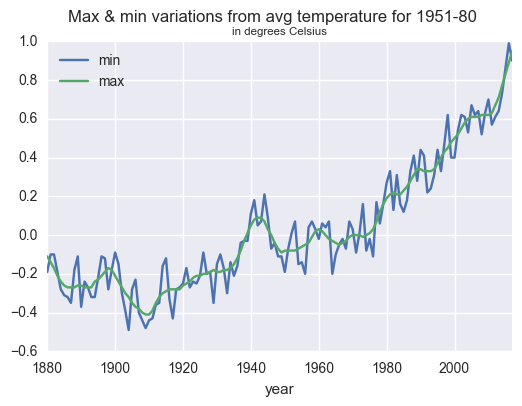

In [2]:
# load historical temperature data

url = 'https://climate.nasa.gov/system/internal_resources/details/original/647_Global_Temperature_Data_File.txt'
temps = pd.read_csv(url, sep= '\t', header=None)

temps.rename(columns={0:'year', 1:'min', 2:'max'}, inplace=True)
temps.set_index('year', inplace=True)

temps.plot()
plt.suptitle('Max & min variations from avg temperature for 1951-80')
plt.title('in degrees Celsius', fontsize='x-small');

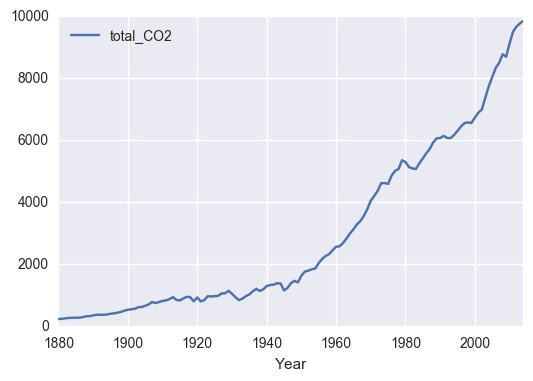

In [3]:
# Compare with global CO2

# Global state of CO2
url = 'http://cdiac.ess-dive.lbl.gov/ftp/ndp030/CSV-FILES/global.1751_2014.csv'
df = pd.read_csv(url)
df.drop(0, inplace=True)
df = df.iloc[:,0:2].astype(int).set_index('Year')
colname = df.columns[0]
df.rename(columns = {colname:'total_CO2'}, inplace=True)

# plot same for same timeframe as temp data
df.loc[1880:].plot();

# Load per capita CO2 data

In [163]:
mypath = 'data/final_nov18/'

filename = 'final_df.csv'
df = pd.read_csv(mypath + filename)

# assign name attribute to df
df.name = filename.split('_')[0]
df.head()

,country,region,sub-region,year,CO2_pc,energy_use_pc,energy_production_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
0,Afghanistan,Asia,Southern Asia,1949,0.00182,NaN,NaN,NaN,1030.0,NaN,NaN,NaN,NaN
1,Afghanistan,Asia,Southern Asia,1950,0.01088,NaN,NaN,NaN,1040.0,NaN,NaN,7752118.0,NaN
2,Afghanistan,Asia,Southern Asia,1951,0.01169,NaN,NaN,NaN,1060.0,NaN,NaN,7839426.0,NaN
3,Afghanistan,Asia,Southern Asia,1952,0.01155,NaN,NaN,NaN,1070.0,NaN,NaN,7934798.0,NaN
4,Afghanistan,Asia,Southern Asia,1953,0.01323,NaN,NaN,NaN,1120.0,NaN,NaN,8038312.0,NaN


In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 13 columns):
country                 17055 non-null object
region                  17055 non-null object
sub-region              17055 non-null object
year                    17055 non-null int64
CO2_pc                  17055 non-null float64
energy_use_pc           5324 non-null float64
energy_production_pc    5978 non-null float64
hdi                     3898 non-null float64
income_pc               14969 non-null float64
gini_idx                5281 non-null float64
military_%gdp           8016 non-null float64
population              12517 non-null float64
gas_price_liter         3995 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.7+ MB


In [82]:
# for now, just focus on CO2 values
val = 'CO2_pc'
co2_df = df.iloc[:,:5]
co2_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 5 columns):
country       17055 non-null object
region        17055 non-null object
sub-region    17055 non-null object
year          17055 non-null int64
CO2_pc        17055 non-null float64
dtypes: float64(1), int64(1), object(3)
memory usage: 666.3+ KB


# Helper Functions

In [7]:
# Create x, where x the 'scores' column's values as floats
#x = df[['score']].values.astype(float)

# Create a minimum and maximum processor object
#min_max_scaler = preprocessing.MinMaxScaler()

# Create an object to transform the data to fit minmax processor
#x_scaled = min_max_scaler.fit_transform(x)

In [8]:
def assign_name(row):
    df = row['df']
    df.name = row['labels']
    
def facetize_df(df, facet):
    """
    Splits df into list of smaller dfs for each categorical value
    """
    facet_dfs = [df.loc[df[facet]==f] for f in df[facet].unique()]
    facet_list = [f for f in df[facet].unique()]
    
    facet_dfs = pd.DataFrame({'df': facet_dfs, 'labels': facet_list})
    
    #facet_dfs = facet_dfs.apply(assign_name, axis=1)
    return facet_dfs


### Plotly

In [9]:
# refactored
def plotly_line2(df, val):
    name = df.name
    df = df.pivot('year', 'country', val)
    fig = df.iplot(asFigure = True,\
                    title = " ".join([val,name]),\
                    yTitle = str.title('%s in metric tonnes' % val),\
                    theme = 'ggplot')
    
    return fig

def plotly_timeseries(df, value):
    fig = plotly_line2(df, value)
    py.offline.iplot(fig)
    
    
def plot_facet_timeseries(df, facet, val):
    #df_list = facetize_df(df, facet)
    #pd.Series(df_list).apply(plotly_timeseries, args=[val])
    for f in df[facet].unique():
        facet_df = df.loc[df[facet]==f]
        facet_df.name = f
        plotly_timeseries(facet_df, val)


In [10]:
# create category levels for a column
def cut_column(df, col):
    level = pd.qcut(df[col].fillna(0), 4, \
                  duplicateds = 'drop', \
                   labels = ['1 low %s' % col, '2 med %s' % col, '3 high %s' % col, '4 very high %s' % col])
    df[col] = level
    return df

# generic bubble plot, categorized by region
def plot_bubble(df, col, cut_by):
    #categories = cut_by
    df.iplot(kind='bubble', x=x, y=y, size=size, text='country',\
           xTitle=str.title(x), yTitle=y, categories=cut_by, \
             title= '%s vs %s for %s (%s)' % (x.upper(), y.upper(), q.upper(), yr))

# bubble plot with, categorized by 'col' levels
def plot_bubble_with_cuts(df, col, cut_by='region'):
    if cut_by:
        cut_df = cut_column(df.copy(), cut_by)
        #return cut_df.head()
        plot_bubble(cut_df, col, cut_by)
    else:
        pass
        
        #plot_bubble(df, col)
        


# Explore data

## Who has the highest & lowest CO2?

In [19]:
# top 10 co2 per cap. emitters for most recent year
max_yr = co2_df['year'].max()
q = "year == @max_yr"

co2_df.query(q)[['country',val, 'sub-region']].sort_values(val, ascending=False).head(10)

,country,CO2_pc,sub-region
12154,Qatar,40.45868,Western Asia
15241,Trinidad And Tobago,34.51710,Caribbean
3729,Cura Ao,34.05183,Caribbean
8443,Kuwait,27.25649,Western Asia
1109,Bahrain,23.68042,Western Asia
2097,Brunei,18.91702,South-Eastern Asia
15662,United Arab Emirates,18.70654,Western Asia
8875,Luxembourg,18.64675,Western Europe
5073,Falkland Is Malvinas,18.06240,South America
12795,Saudi Arabia,17.92586,Western Asia


In [20]:
# bottom 10 co2 per cap. emitters for most recent year
co2_df.query(q)[['country',val, 'sub-region']].sort_values(val, ascending=False).tail(10)

,country,CO2_pc,sub-region
4947,Ethiopia,0.11245,Eastern Africa
10710,Niger,0.10685,Western Africa
9078,Malawi,0.07859,Eastern Africa
12589,Rwanda,0.07215,Eastern Africa
2869,Central African Republic,0.06305,Middle Africa
9220,Mali,0.06188,Western Africa
13357,Somalia,0.06071,Eastern Africa
2924,Chad,0.04630,Middle Africa
3412,Congo Dem Rep,0.03831,Middle Africa
2340,Burundi,0.02803,Eastern Africa


### Observations

Top CO2 per capita emitters are either:
* oil-producing countries (no suprise).
* tiny ountries like Luxembourg & Curaçao (surprise).

And while the big emitters can be found across the world, the lowest emitters are all in Africa.
## Global distributions

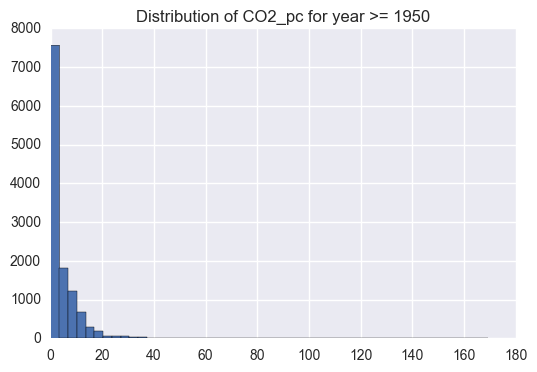

In [21]:
# CO2 dist since 1950
q = "year >= 1950"

co2_df.query(q)[val].hist(bins=50)
plt.title('Distribution of %s for %s' % (val, q)); 

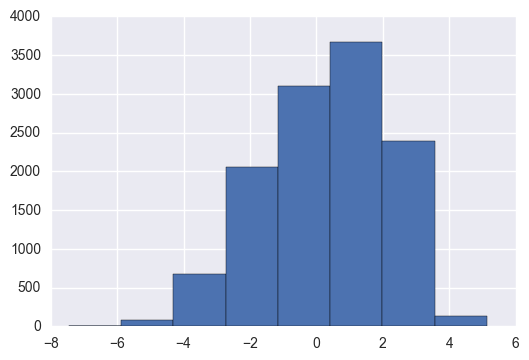

In [22]:
# log transform this long-tailed data
co2_df.query(q)[val].apply(np.log)\
    .replace([np.inf, -np.inf], np.nan).hist(bins=8);

## Countries distribution

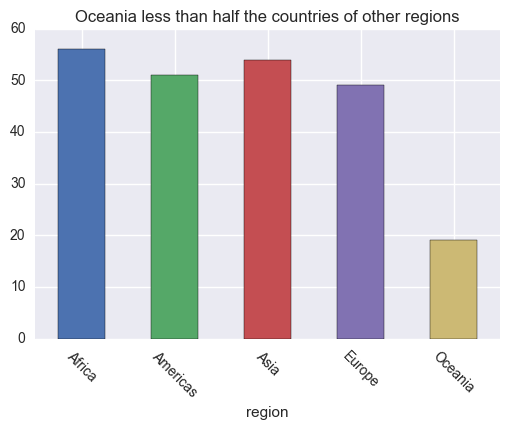

In [23]:
# How many countries in each region?
co2_df.groupby('region')['country'].nunique().plot(kind='bar', rot=-45)
plt.title('Oceania less than half the countries of other regions');

In [24]:
# country counts by region
co2_df.groupby(['region'])['country'].nunique().sort_values()

region
Oceania     19
Europe      49
Americas    51
Asia        54
Africa      56
Name: country, dtype: int64

## Distribution by region

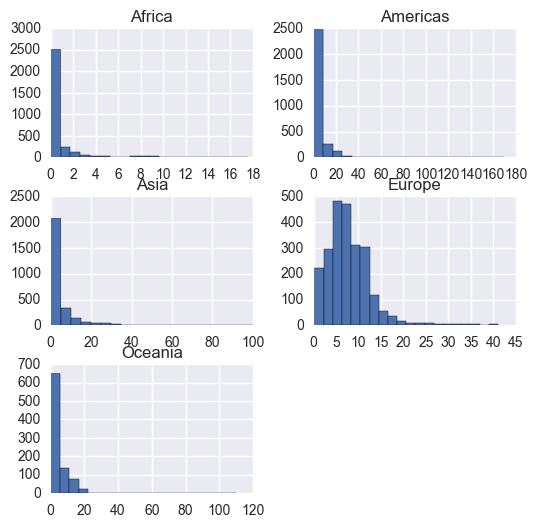

In [25]:
# dist by region
q = "year >= 1950"
co2_df.query(q).sort_values('region').set_index(['region', 'sub-region','country','year'])\
    .unstack(level=(0))[val]\
    .hist(bins=20, figsize=(6,6));

Interestingly, only Europe has a quasi-normal distribution. Everywhere else has extremely negatively-skewed distributions.

The longest tail appears to be in the Americas, to judge by the x-axis range.

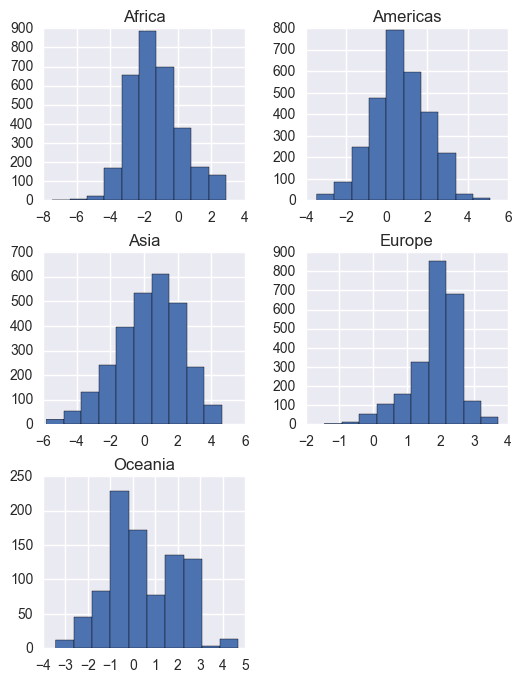

In [26]:
# apply natural log transform on CO2_pc
log_co2 = co2_df.query(q).sort_values('region').set_index(['region', 'sub-region','country','year'])\
    .unstack(level=0)[val].apply(np.log)
    
# replace numpy infinite values with nans
log_co2.replace([np.inf, -np.inf], np.nan)\
    .hist(bins=10, figsize=(6,8));


The distribution of the log `CO2_pc` values becomes normal except for: 
* Europe, which has a slight positive skew.
* Oceania, which appears to be bi-modal.

### Observations

*Europe has the only normal-ish distribution* 

* All regions have very negative-skew data, except for Europe which is closer to a normal distribution (albeit one with a long tail). 
* Asia & Americas have the longest tails.

*What about outliers?*

I can barely make out the long tails in these histograms. Boxplots will highlight where there are outliers.

## Outliers by region

In [27]:
## helper function

# set style for showing outliers
flierprops = dict(marker='o', markersize=5, alpha=0.2)

def make_regional_boxplot(df, facet, showfliers):
    '''facets dataframe and shows boxplot for
    each facet, with title'''
    df.boxplot(by=facet, showfliers = showfliers, flierprops = flierprops, rot=45)
    plt.title(df['region'].unique())
    plt.show();

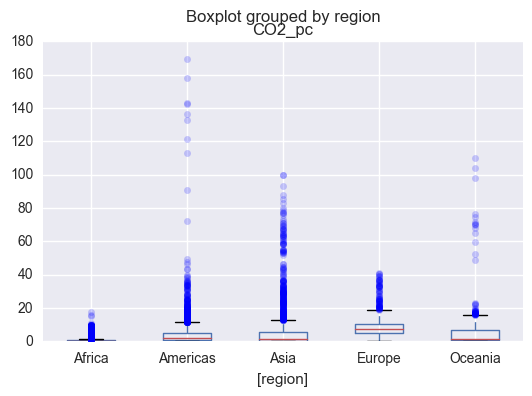

In [28]:
# reshape df so region, sub_region & CO2 are columns
co2_df_box = co2_df.query(q).sort_values(['region', 'sub-region']).\
set_index(['region', 'sub-region','country','year'])[val].reset_index(level=(0,1))
                                                                        
co2_df_box.boxplot(by='region', flierprops = flierprops);

### Observations

* Asia has lots of outliers
* Americas has the most extreme outliers

So which sub-regions are represented by these outliers? Are the outliers spread equally among sub-regions?

## Look at IQRs and outliers

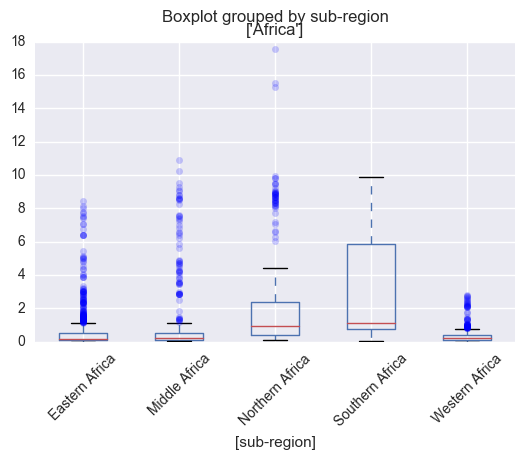

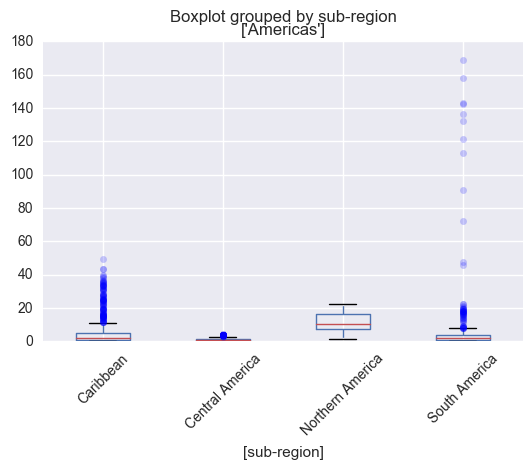

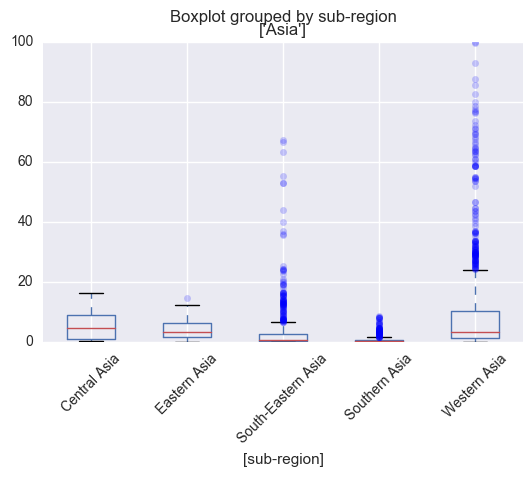

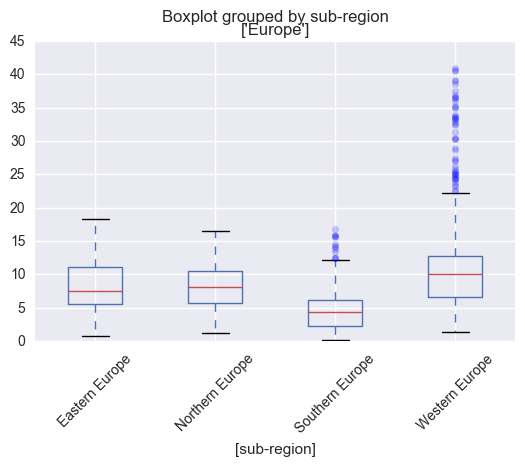

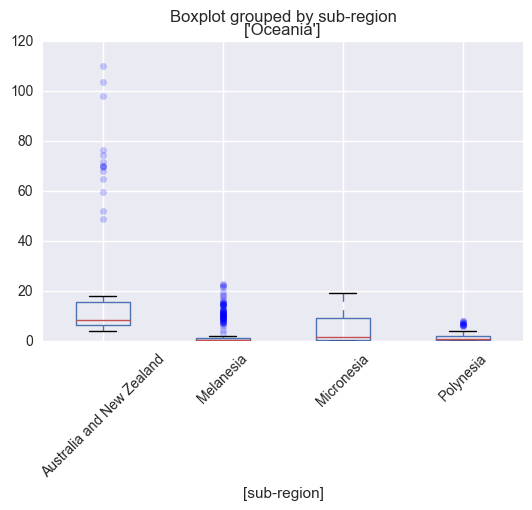

0    None
1    None
2    None
3    None
4    None
Name: df, dtype: object

In [29]:
# make boxplot subplots

# split reshaped into smaller regional co2_df's
regions_co2_dfs = facetize_df(co2_df_box, 'region')
showfliers=True
regions_co2_dfs['df'].apply(make_regional_boxplot, args=['sub-region', showfliers])

### Compare IQRs

Including outliers increases the y-axis scale, making it hard to see the differences in IQRs/boxes.
Hiding outliers will braing focus on the shape of the boxes themselves.

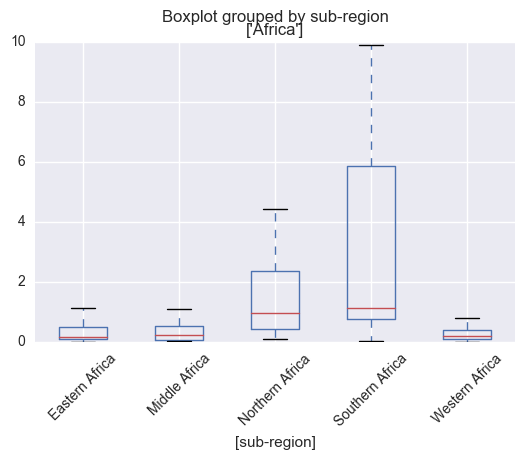

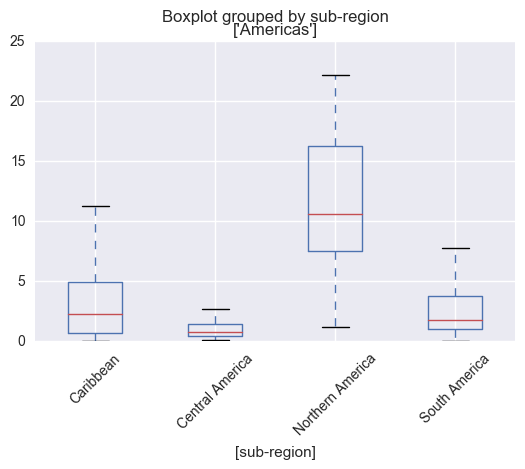

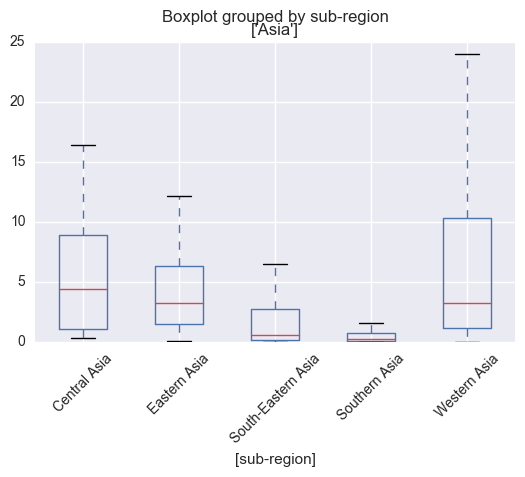

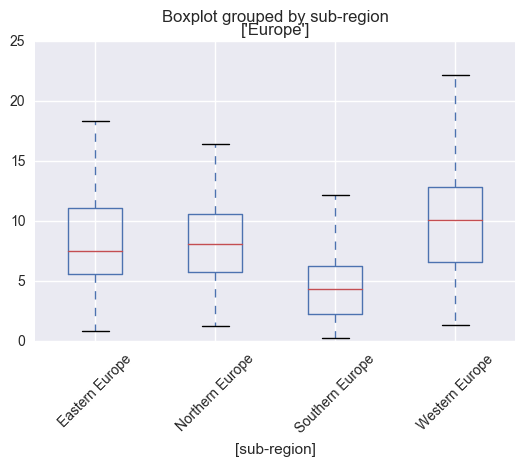

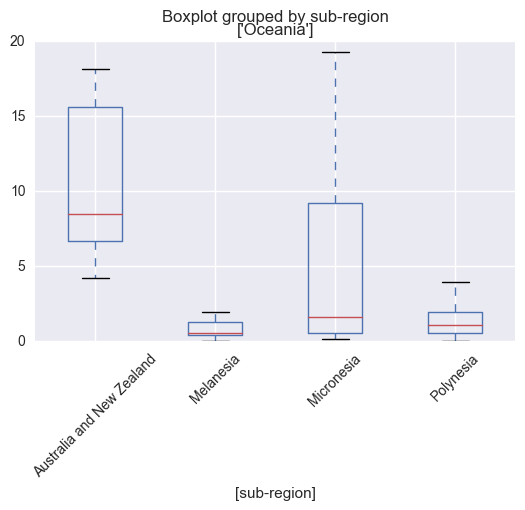

0    None
1    None
2    None
3    None
4    None
Name: df, dtype: object

In [30]:
# hide outliers from boxplots

showfliers=False
regions_co2_dfs['df'].apply(make_regional_boxplot, args=['sub-region', showfliers])

#### Observations
While it's hard to tell which region has the _most_ variation between sub-regions, Europe seems to have the least.

We can quantify this with some stats.

In [31]:
## quantify regional variations

# helper function
def highlight_max(s):
    '''
    highlight the maximum in a Series yellow.
    '''
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]


q = "year >= 1950"
region_stats = co2_df.query(q).groupby('region').describe()[val]
region_stats.style.apply(highlight_max)

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Africa,3134,0.876144,1.829,0,0.08895,0.226705,0.654475,17.5523
Americas,2901,4.72814,9.57233,0.03153,0.8081,1.96057,5.00944,169.127
Asia,2801,5.55792,11.1381,0,0.35772,1.60469,5.368,99.8314
Europe,2368,7.95614,5.26457,0.23512,4.73499,7.17076,10.4254,41.0319
Oceania,903,4.92194,10.2444,0.0322,0.503925,1.23001,6.61092,109.941


In [32]:
# which region is most homogenous, i.e.
# has lowest coefficient of variance?

(region_stats['std']/region_stats['mean']).sort_values()

region
Europe      0.661699
Asia        2.004004
Americas    2.024546
Oceania     2.081364
Africa      2.087555
dtype: float64

### Extreme outliers

In [54]:
# which countries are the extreme outliers for each region?

# get outlier threshold for each region (3rdQuartile + 1.5 * IQR)
region_stats['outlier_th'] = region_stats.apply(
    lambda region: region['75%'] + 1.5 * (region['75%'] - region['25%']), axis=1)

yr = 1950
all_outliers = []
for region in co2_df['region'].unique():
    outlier_th = region_stats['outlier_th'].loc[region]
    q = "year >= @yr & region == @region"
    reg_df = co2_df.query(q)
    reg_df = reg_df.loc[reg_df[val] > outlier_th]\
        .groupby(['region','country']).size()\
        .sort_values()
    all_outliers.append(reg_df)

pd.concat(all_outliers)


region    country              
Asia      Mongolia                  1
          Kazakhstan                7
          Oman                      9
          Singapore                16
          Saudi Arabia             35
          Brunei                   36
          Bahrain                  43
          United Arab Emirates     45
          Kuwait                   54
          Qatar                    55
Europe    East Germany             11
          Luxembourg               59
Africa    Namibia                   1
          Mauritania                2
          Morocco                   9
          Zimbabwe                 10
          Equatorial Guinea        13
          Egypt                    20
          Mauritius                21
          St Helena                21
          Botswana                 24
          Seychelles               30
          Tunisia                  31
          Reunion                  35
          Algeria                  42
          Gabon   

#### Observations

I still get the impression that there is a disproportionate number of tiny countries among the outlier countries in the Americas (such as St Pierre et Miquelon and the Falklands) and Europe (Luxembourg, again), possibly Africa too.

It might be worthwile looking at population or surface area to see if there's a negative correlation with `CO2_pc`.

Note that while tiny countries are among Oceania's outliers, that's less surprising: aside from Australia, virtually all countries in this region are very small.



## `CO2_pc` timeseries

Let's plot over the years to see how CO2 emissions have evolved.

### Mean CO2 since 1950

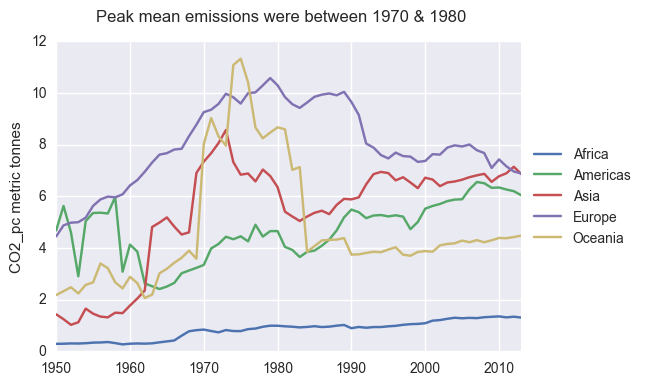

In [34]:
# mean CO2 by year & region
q = 'year >= 1950'
region_year = pd.DataFrame(co2_df.query(q).groupby(['year', 'region']).mean())[val]
region_year.unstack().plot();

plt.ylabel('%s metric tonnes' % val)
plt.xlabel('')
plt.suptitle("Peak mean emissions were between 1970 & 1980")
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

### Medians since 1950

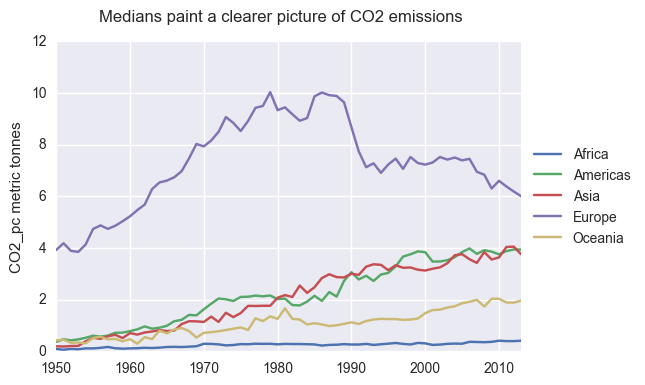

In [35]:
# median CO2 by year & region
region_year = pd.DataFrame(co2_df.query(q).groupby(['year', 'region']).median())[val]
region_year.unstack().plot()

plt.ylabel('%s metric tonnes' % val)
plt.xlabel('')
plt.suptitle("Medians paint a clearer picture of CO2 emissions", fontsize='medium', linespacing=10)
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

#### Observations

Europe remains the CO2 emissions gorilla. 

After steady growth between 1950 to 1980, European emissions wobbled in the 80s, then fell off a cliff around 1990. Emissions plateaued (now at late 60's levels) until around 2005, whereupon they steadily decreased.

By contrast, Asia, the Americas, and to a lesser extent Oceania have seen median CO2 emissions creep steadily upwards for the entire timeframe. You can almost imagine Asia & Amercia's curves converging with Europe's in a decade or so.

At the bottom of the medians plot, African emissions initially appear to be virtually flat, but they are increasing too. But Africa's baseline is so much lower in the first place that its CO2 growth is dwarfed by that of other regions.

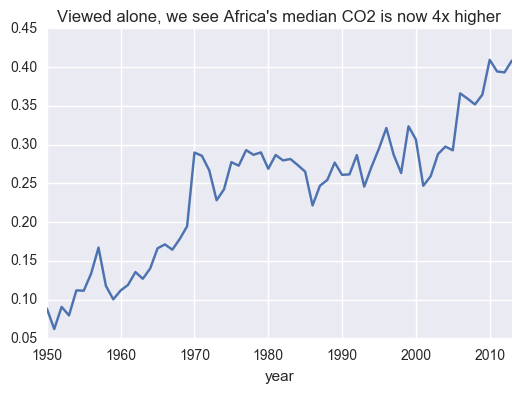

In [36]:
# show median Africa on its own
region_year.unstack()['Africa'].plot()
plt.title("Viewed alone, we see Africa's median CO2 is now 4x higher");


#### Stats

Here we'll quantify the percentage change in median CO2 emssions for time period `q`.

In [37]:
# create df of start & end year medians
start = region_year.unstack().index.min()
end = region_year.unstack().index.max()
region_year.unstack().loc[[start, end]]

# show % change of median value since beginning of time frame
change = region_year.unstack().loc[[start, end], ].pct_change()
change.sort_values(2013, axis=1)\
    .multiply(100).round()\
    .dropna(how='all')


region,Europe,Africa,Oceania,Americas,Asia
year,,,,,
2013,53.0,361.0,369.0,980.0,1833.0


Wow. Usually plots are more eye-opening than numbers, but in this case it's the reverse.

# Zoom in on Europe

Why focus on Europe? 

* As home of the modern era's original superpowers, it has contributed the most to cumulative CO2 emissions. 
* For the 1950-2013 timefrme, Europe has the most homoegenous emission rates across sub-regions (measured by the coefficient of variation in mean `CO2_pc`)
* Unlike the other continents, median emissions have decreased dramatically since the mid-80s.
* Last but not least, it's been my home for the past 10 years (I'm Canadian but live in France).

## Plots

In [61]:
# create europe CO2 df
q = "region=='Europe' & year >= 1950"
co2_eur_df = co2_df.query(q).loc[co2_df['region']=='Europe'].copy().reset_index(drop=True)

# assign name attribute for use in plot titles
co2_eur_df.name = 'Europe CO2'


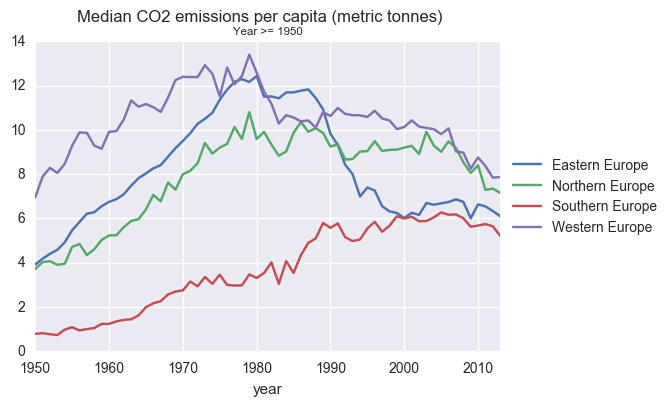

In [39]:
# create df of sub-region medians
q = "year >= 1950"
eur_medians = co2_eur_df.query(q).groupby(['year','region', 'sub-region'])[val].median().unstack()
eur_medians.reset_index('region').plot()

# plot
plt.suptitle('Median CO2 emissions per capita (metric tonnes)')
plt.title(str.title(q), fontsize='x-small')
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

#### Observations

Convergence! Median `CO2_pc` in Western Europe has fallen enough while Southern Europe's has increased so that the gap has been cut in half.

In [40]:
# gap in 1950
eur_medians.loc[start, 'Western Europe'].subtract(eur_medians.loc[start, 'Eastern Europe'])

region
Europe    3.03363
dtype: float64

In [41]:
# gap in 2013
eur_medians.loc[end, 'Western Europe'].subtract(eur_medians.loc[end, 'Eastern Europe'])

region
Europe    1.76512
dtype: float64

### Duplicate data?

One thing I noticed while cleaning the updated CO2 data is that, unlike for the original dataset, there seemed to be overlapping countries, such as:

* Germany, East Germany, and West Germany
* USSR and Russia
* The countries that were once part of Czechoslovakia & Yugoslavia

I'd like to drill-down on each sub-region to see whether there is duplicate data. For this, I'll need interactive plots. Plot.ly is excellent for this sort of thing.

In [42]:
# create spaghetti plots for each sub-region
plot_facet_timeseries(co2_eur_df, 'sub-region', 'CO2_pc')

#### Observations

There is plenty of duplicate data. See for yourself.

 * To view only one country, **double-click** the country in the legend. Then **single-click** the others to add them.
 * To reset, **double-click any other value**.

Western Europe: 
* Filter the plot so you only see E. Germany, W. Germany, and Germany.
   
* We have duplicate data

Eastern Europe:
* Do same as above for: 
    * Russia & Ussr - overlapping data
    * Czecheslovakia, Czech Rep. & Slovak Rep - overlap again. The line for Czech Rep. is actually _above_ that for Czecheslovakia, which doesn't make sense unless the latter is in reality an average of Slovak & Czech Republic.  
    
    
Southern Europe:
* Serbia; Serbia And Montenegro; Montenegro - overlap
* Yugoslavia is classified inconsistently as Eastern Europe, but does NOT overlap with the Serbias.

#### Clean & de-dupe

In [43]:
# change Yugoslavia so it's Southern Europe

# get index locations
yugo = co2_eur_df.loc[co2_eur_df['country']=='Yugoslavia']

# set new value
co2_eur_df['sub-region'].iloc[yugo.index]= 'Southern Europe'

# verify
co2_eur_df[co2_eur_df['country']=='Yugoslavia'].head()

/Users/sarahhosking/anaconda/envs/DAND/lib/python2.7/site-packages/pandas/core/indexing.py:194: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,country,region,sub-region,year,CO2_pc
2326,Yugoslavia,Europe,Southern Europe,1950,1.08734
2327,Yugoslavia,Europe,Southern Europe,1951,1.01549
2328,Yugoslavia,Europe,Southern Europe,1952,1.00816
2329,Yugoslavia,Europe,Southern Europe,1953,0.98762
2330,Yugoslavia,Europe,Southern Europe,1954,1.16343


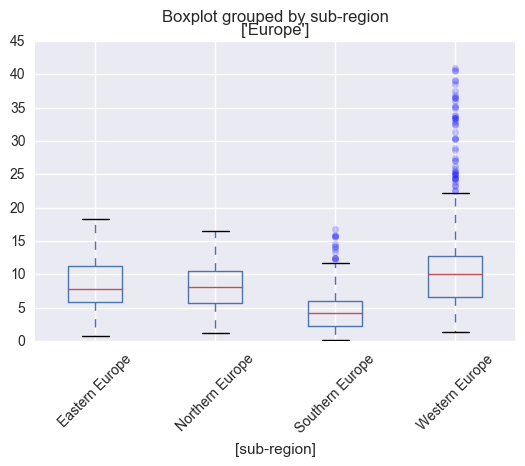

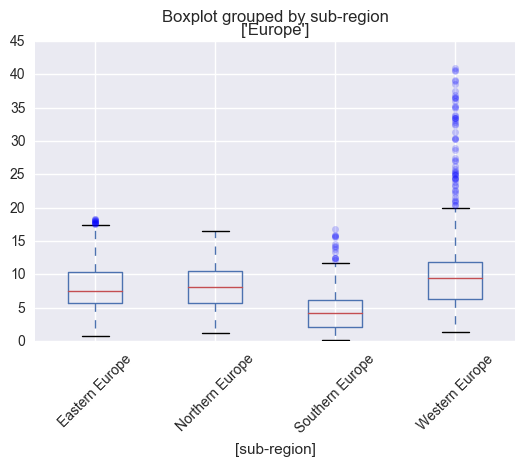

In [44]:
# Does this change the distributions?

drop_dupes = ['East Germany', 'West Germany', 'Ussr', 'Czechoslovakia', 'Serbia And Montenegro']
drop_index = co2_eur_df.loc[co2_eur_df['country'].isin(drop_dupes)].index

# show outliers in boxplots
showfliers = True

# with original df
make_regional_boxplot(co2_eur_df.set_index(['country', 'year']), 'sub-region', showfliers);

# with de-duped df
make_regional_boxplot(co2_eur_df.drop(drop_index)\
                      .set_index(['country', 'year']), 'sub-region', showfliers);


I'm barely able to see a difference in the boxplots. It should be easier to see if we compare before & after using `describe()`.

In [62]:
# before, with overlapping countries
co2_eur_orig = co2_eur_df.query(q).groupby('sub-region').describe()[val]

# after dropping overlapping countries
co2_eur_dedupe = co2_eur_df.drop(drop_index).query(q).groupby('sub-region').describe()[val]

# what's the difference?
co2_eur_dedupe - co2_eur_orig

,count,mean,std,min,25%,50%,75%,max
sub-region,,,,,,,,
Eastern Europe,-84.0,-0.450816,-0.137418,0.0,-0.190250,-0.378645,-1.014138,0.0
Northern Europe,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0
Southern Europe,-14.0,0.004104,0.031039,0.0,-0.031025,0.026120,0.022090,0.0
Western Europe,-82.0,-0.411092,0.414775,0.0,-0.314710,-0.675700,-0.938580,0.0


In [63]:
# let's fix this for good
co2_eur_df = co2_eur_df.drop((drop_index))

### Observations

**Emissions exploded across the board during Baby Boomer decades**

From 1950 to the late 70s, all European sub-regions show steadily growing CO2 pc emissions. Southern Europe's CO2 emissions grew more slowly, however.

**Paths diverged during the 80s**

During the early 80s the curves begin to diverge not just between the sub-regions, but also within. The collapse of the Soviet Union in the late 80s-early 90s is seen in the sharp drop of the red CO2 curve for all sub-regions. Not surprisingly, this suggests a strong relationship between CO2 per capita emissions and economic activity.

This relationship is reinforced in the plot for "middle" (East & West) Europe. While the median for ex-USSR countries has a smooth upward trajectory all the way to the late 70s, the curve for non-Soviet nations indicates more volatile emissions for the decade starting ~1969. This era coincides with the OPEC oil crisis and consequent hyperinflation, market forces that I presume would not impact the centralized economy of the Soviet Union.

By contrast, S Europe median CO2 emissions kept on increasing, more slowly than in North and 'Middle' (East & West) Europe. Similarly, the curves divergence lagged the other sub-regions by a few years, not starting until the mid-80s. 

**Convergence in the last few years**

By the  the late 2000's, all sub-regions show a) downward trend in median CO2 emissions, and that b) the decline is noticeably faster for 'other' countries than for ex-USSR states.

### What prompted the CO2 declines of recent years?

Two things come to mind: 
* after 3 years of negotiating targets, 2008 marked the start of Phase 1 implementation for the Kyoto Protocol (Phase 1 ended in 2012)
* in the 2nd half of 2008 the global financial crash (Great Recession) began.




## Where have CO2 emissions decreased the most?

So the burning question (pardon the pun) is which European countries are seeing the most rapid decreases in CO2 emissions?

In [64]:
# get year of max CO2 for each country
max_co2 = co2_eur_df.set_index('year').groupby(['country'])[val].idxmax()\
    .reset_index()\
    .rename(columns={'CO2_pc':'year'})

In [65]:
# get max CO2 values for each country
merge_df = co2_eur_df[['country','year','CO2_pc']]
max_co2 = max_co2.merge(merge_df, on=['country', 'year'], how='inner')

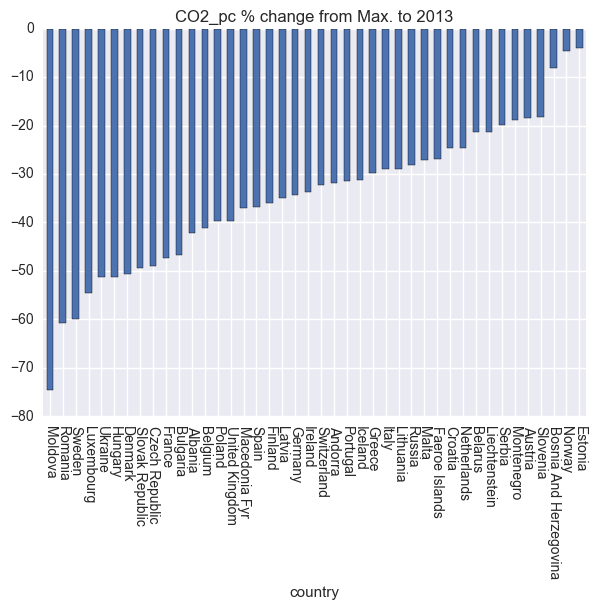

In [49]:
# get CO2 values for 2013
q = "year==2013"
co2_2013 = co2_eur_df.query(q)[['country','year','CO2_pc']]\
    .reset_index(drop=True)

#create df of max & 2013 values
changes = pd.concat([max_co2, co2_2013]).sort_values('country')\
    .groupby(['country', 'year']).mean()\
    .reset_index()\

# label which row is max value vs 2013 value for each country
changes['max_last'] = changes['year'].apply(lambda x: 'maxval' if x != 2013 else 'lastval')

# pivot df & calc change
changes_wide = changes.set_index(['country', 'max_last', 'year']).reset_index(['country','year'])\
    .drop('year', axis=1).pivot(columns='country', values='CO2_pc')\
    .reindex(index=['maxval', 'lastval'])\
    .pct_change()

# plot % change
changes_wide.drop('maxval')\
    .multiply(100)\
    .T.sort_values('lastval')\
    .dropna()\
    .plot(kind='bar', legend=None, rot=-90, figsize=(7,5))

plt.title(" ".join([val, '% change from Max. to 2013']));

In [50]:
## Helper functions

# calculate % change
def calc_percent_change(df, interval=1):
    """Reshapes & sorts df then calculates
    percentage change since previous interval of rows."""
    change_df = df.sort_values(['region', 'sub-region'])\
        .set_index(['region','sub-region','country','year'])\
        .unstack(level=(0,1,2))[val].pct_change(interval)
    
    return change_df

# create facet list
def make_facet_list(df, facet):
    facets = [facet for facet in df[facet].unique()]
    return facets

# reshape for heatmap
def reshape_for_heatmap(facet, df):
    facet_df = df.stack(level=(0,1)).reset_index(['region','sub-region'])
    facet_df = (facet_df.loc[facet_df['sub-region']==facet]
        .drop(['region','sub-region'], axis=1) #don't show in heatmap
        .dropna(axis=1, how='all') # removes cols for countries from other facets
        .sort_values(2013, axis=1, ascending=False))
    
    return facet_df

# format %change
def color_negative_red(val):
    """
    Takes a scalar and returns a string with
    the css property `'color: red'` for negative
    strings, black otherwise.
    """
    color = 'red' if val < 0. else 'black'
    return 'color: %s' % color


In [79]:
q = "region=='Europe' & year >=1980"
title = " ".join([val, '% change for ', q])

df = co2_df.query(q)
df = (df.drop(['region','sub-region'], axis=1)
     .pivot('year', 'country', 'CO2_pc')
     .pct_change(5).multiply(100)
     .sort_values(2013, axis=1) # countries sorted by 2013 CO2_pc values
     .dropna(how='all'))

df.iplot(kind='heatmap', colorscale='Spectral', title=title)

In [52]:
df.loc[2013].dropna(how='all').tail(10)

country
Belarus                   0.052089
Ukraine                   0.057505
Gibraltar                 0.061606
Bosnia And Herzegovina    0.062024
Lithuania                 0.080738
Moldova                   0.099409
Albania                   0.117436
Russia                    0.134701
Montenegro                0.223480
Estonia                   0.383856
Name: 2013, dtype: float64

In [53]:
co2_change.head().style.applymap(color_negative_red)

NameError: name 'co2_change' is not defined

In [ ]:
# create % change matrix
q = "region=='Europe' & year >=1990"
co2_change = calc_percent_change(co2_df.query(q), interval=5)


for sub in co2_df.query(q)['sub-region'].unique():
    sub_df = reshape_for_heatmap(sub, co2_change)
    sub_df.iplot(kind='heatmap', colorscale='Spectral', title=sub + ' (Non-normalized)')

In [ ]:
# normalize rows between [1,-1] 

mins = abs(co2_change.min(axis=0)) # using abs to ensure result of division is neg
maxes = co2_change.max(axis=0)

neg = co2_change.mask(co2_change > 0).div(mins, axis=1)
pos = co2_change.mask(co2_change < 0).div(maxes, axis =1)
normalized_change = neg.fillna(pos)


# create heatmaps by sub-region
#facets = make_facet_list(co2_df.query(q), 'sub-region')
#pd.Series(facets).apply(reshape_for_heatmap, args=(normalized_change,))

for sub in co2_df.query(q)['sub-region'].unique():
    sub_df = reshape_for_heatmap(sub, normalized_change)
    sub_df.iplot(kind='heatmap', colorscale='Spectral', title=sub + ' (Normalized)')
             

In [ ]:
eur_subs = [sub for sub in co2_df.query("region=='Europe'")['sub-region'].unique()]
eur_subs

In [ ]:

for sub in eur_subs:
    
    new_df = co2_change.stack(
        level=(0,1)).reset_index(['region','sub-region'])
    sub_df = new_df.loc[new_df['sub-region']==sub].dropna(axis=1, how='all').iplot(kind='heatmap', colorscale='Spectral')
    
# plot
#co2_change.stack(['region', 'sub-region']).reset_index().set_index('year').iplot(kind='heatmap', colorscale='spectral')

### Kyoto targets: were they met?


In [ ]:
# values from https://ec.europa.eu/clima/policies/strategies/progress/kyoto_1_en
kyoto = pd.read_csv('data/kyoto_targets.csv')
kyoto.head()

In [ ]:
# get co2 values to calculate whether countries
# met Kyoto targets

k_target = kyoto.rename(columns={'base_yr':'year', 'target':'target_chg'})

# get base yr CO2 values
targets = k_target.merge(co2_eur_df, on=['country','year'], how='left')


# get 2012 CO2 values
q = "year == 2012"
co2_2012 = co2_eur_df.query(q).drop('year', axis=1)

# merge with targets df
targets = targets.merge(co2_2012[['country','CO2_pc']], on ='country')\
    .rename(columns={'CO2_pc_x':'base_co2', 'CO2_pc_y': 'actual_co2'})

targets

In [ ]:
# calculate % change from base year to 2012
actual_change = pd.melt(targets, id_vars=['country'], value_vars=['base_co2', 'actual_co2'])\
    .sort_values('country')\
    .pivot(index='variable', columns='country', values='value')\
    .reindex(index=['base_co2', 'actual_co2'])\
    .pct_change()\
    .drop('base_co2').T
    
actual_change.rename(columns={'actual_co2': 'actual_chg'}, inplace=True)

# merge with 
targets = targets.merge(actual_change.reset_index())
targets['target_co2']= targets['base_co2'].multiply(1 + targets['target_chg'])

In [ ]:
targets.set_index('country')[['target_co2', 'actual_co2']]\
    .sort_values('target_co2')\
    .plot(kind='bar', rot=-90);

In [ ]:
# how much did actual change % correlate with target change %?
targets.corr()['target_co2']

In [ ]:
# did they meet the 8% reduction for the original 15 EU countries?
targets.groupby('eu-15').sum()[['base_co2', 'actual_co2']].pct_change(axis=1)

In [ ]:
subset = kyoto['eu-15']==True
eu15 = kyoto.loc[subset]['country']

q="country in @eu15"
targets.query(q).join(actual_change)[['target_chg', 'actual_chg']]\
    .sort_values('target_chg')\
    .plot(kind='bar')
    
plt.suptitle(" ".join(['Kyoto Target vs Actual', val, '%change, 2008-2012']))    
plt.title(q, fontsize='x-small');

In [ ]:
# mean overall change for eu15
target_change.query(q).join(actual_change)[['target_chg', 'actual_chg']]\
    .mean()

In [ ]:
q="country not in @eu15"
target_change.query(q).join(actual_change)[['target_chg', 'actual_chg']]\
    .sort_values('target_chg')\
    .plot(kind='bar')
    
plt.suptitle(" ".join(['Kyoto Target vs Actual', val, 'change, 2008-2012']))    
plt.title(q, fontsize='x-small');

In [ ]:
# mean overall change for non-eu15
target_change.query(q).join(actual_change)[['target_chg', 'actual_chg']]\
    .mean()

In [ ]:
# what about non-eu countries?

# create list of non-eu countries
not_eu = ~co2_eur_df['country'].isin(kyoto['country'].unique())
co2_eur_df['country'].loc[not_eu].unique()


### How much did meeting targets have to do with the accord, vs the economy?
Is there a stronger CO2 correlation with these targets, or with GDP? My hunch is the wealthier the country, the better able to comply with kyoto...at least in Europe. 

Or, to phrase it another way, I suspect the recent decreases in CO2_pc among S. European countries like Greece and Spain were more linked to the 2008 financial crises than the targets set by Kyoto (especially since many of these countries actually had positive change targets, as a way to balance the historical burden of CO2 emissions).


# Multi-variate analysis

In [407]:
# expand DF to include all columns
df = pd.read_csv(mypath + 'final_df.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17055 entries, 0 to 17054
Data columns (total 13 columns):
country                 17055 non-null object
region                  17055 non-null object
sub-region              17055 non-null object
year                    17055 non-null int64
CO2_pc                  17055 non-null float64
energy_use_pc           5324 non-null float64
energy_production_pc    5978 non-null float64
hdi                     3898 non-null float64
income_pc               14969 non-null float64
gini_idx                5281 non-null float64
military_%gdp           8016 non-null float64
population              12517 non-null float64
gas_price_liter         3995 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.7+ MB


In [408]:
# drop duplicate countries as per Zoom-in on Europe section
drop_index = df.loc[df['country'].isin(drop_dupes)].index
df = df.drop(drop_index)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16677 entries, 0 to 17054
Data columns (total 13 columns):
country                 16677 non-null object
region                  16677 non-null object
sub-region              16677 non-null object
year                    16677 non-null int64
CO2_pc                  16677 non-null float64
energy_use_pc           5324 non-null float64
energy_production_pc    5978 non-null float64
hdi                     3898 non-null float64
income_pc               14969 non-null float64
gini_idx                5281 non-null float64
military_%gdp           8016 non-null float64
population              12337 non-null float64
gas_price_liter         3995 non-null float64
dtypes: float64(9), int64(1), object(3)
memory usage: 1.8+ MB


## About the data

(Insert descriptions)

## Distributions

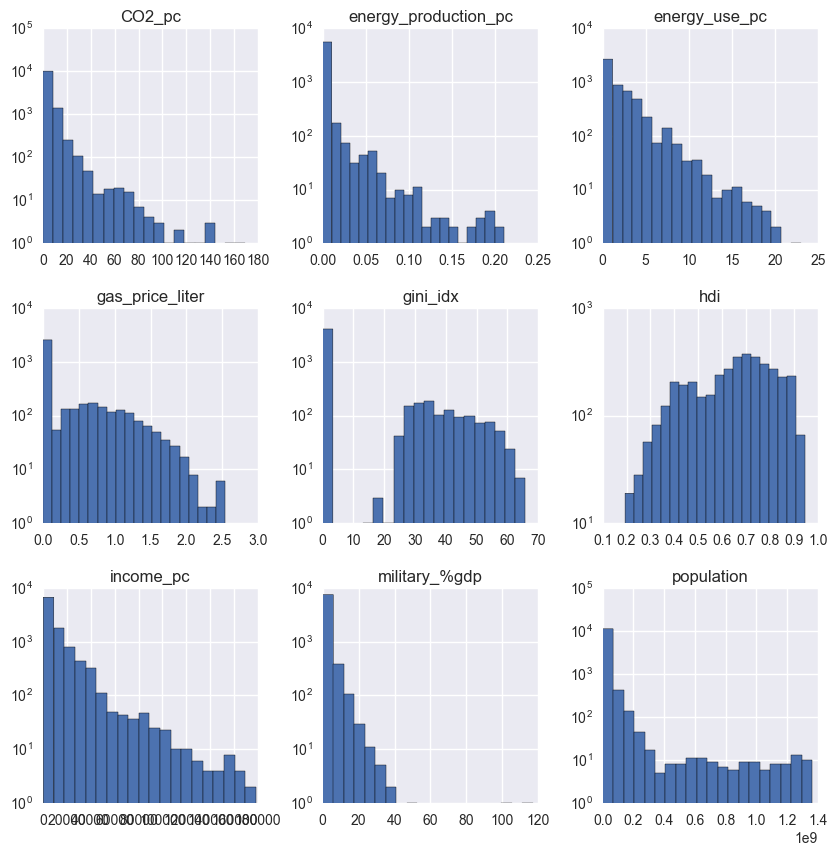

In [409]:
# plot with log y-axis
q = "year >= 1950"
df.query(q).drop(['year'], axis=1)\
    .hist(figsize=(10,10), log=True, bins=20); 

In [311]:
# stats
df.query(q).describe()

,year,CO2_pc,energy_use_pc,energy_production_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
count,11927.000000,11927.000000,5324.000000,5978.000000,3898.000000,10443.000000,5281.000000,8016.000000,1.191000e+04,3995.000000
mean,1983.694726,4.459047,2.214475,0.004249,0.642076,11380.272527,9.071180,2.179175,2.456421e+07,0.323087
std,18.231268,8.409955,2.573136,0.015106,0.168172,16703.627118,17.275076,3.421640,9.878111e+07,0.508171
min,1950.000000,0.000000,0.009021,0.000000,0.194000,247.000000,0.000000,0.000000,1.072000e+03,0.000000
25%,1968.000000,0.347585,0.517125,0.000160,0.507000,2030.000000,0.000000,0.000000,4.839058e+05,0.000000
50%,1985.000000,1.545490,1.169405,0.000510,0.669000,5250.000000,0.000000,1.470000,4.515785e+06,0.000000
75%,2000.000000,5.915515,3.033446,0.001750,0.774000,13700.000000,0.000000,2.740000,1.446561e+07,0.610000
max,2013.000000,169.126690,23.071099,0.210000,0.945000,178000.000000,65.800000,117.000000,1.362514e+09,2.540000


In [315]:
# look at rows containing 0 values
fltr = df==0.
df.loc[df.where(fltr).dropna(how='all').index]

,country,region,sub-region,year,CO2_pc,energy_use_pc,energy_production_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
11,Afghanistan,Asia,Southern Asia,1960,0.04606,NaN,NaN,NaN,1210.0,NaN,0.000,8994793.0,NaN
12,Afghanistan,Asia,Southern Asia,1961,0.05361,NaN,NaN,NaN,1200.0,NaN,0.000,9164945.0,NaN
13,Afghanistan,Asia,Southern Asia,1962,0.07377,NaN,NaN,NaN,1200.0,NaN,0.000,9343772.0,NaN
14,Afghanistan,Asia,Southern Asia,1963,0.07424,NaN,NaN,NaN,1190.0,NaN,0.000,9531555.0,NaN
15,Afghanistan,Asia,Southern Asia,1964,0.08631,NaN,NaN,NaN,1190.0,NaN,0.000,9728645.0,NaN
16,Afghanistan,Asia,Southern Asia,1965,0.10149,NaN,NaN,NaN,1190.0,NaN,0.000,9935358.0,NaN
17,Afghanistan,Asia,Southern Asia,1966,0.10766,NaN,NaN,NaN,1180.0,NaN,0.000,10148841.0,NaN
18,Afghanistan,Asia,Southern Asia,1967,0.12377,NaN,NaN,NaN,1180.0,NaN,0.000,10368600.0,NaN
19,Afghanistan,Asia,Southern Asia,1968,0.11554,NaN,NaN,NaN,1200.0,NaN,0.000,10599790.0,NaN
20,Afghanistan,Asia,Southern Asia,1969,0.08685,NaN,NaN,NaN,1190.0,NaN,0.000,10849510.0,NaN


### Lots of zeros

There seems to be a lot of zero values here that should actually be NaNs. For example, I truly doubt the price of gas anywhere, at anytime, was 0. Nor can I believe that war-torn Afghanistan spent 0% of GDP on the military during the 60s,70s, and 80s! 

Similarly, the gini inequality index has a scale of 0-100, where 0 = perfect equality. How many countries achieved such a Utopian state?

In [297]:
q = "gini_idx==0."
df.query(q).groupby('country').mean()['gini_idx']

country
Albania                     0.0
Algeria                     0.0
Angola                      0.0
Argentina                   0.0
Armenia                     0.0
Australia                   0.0
Austria                     0.0
Azerbaijan                  0.0
Bangladesh                  0.0
Belarus                     0.0
Belgium                     0.0
Belize                      0.0
Benin                       0.0
Bhutan                      0.0
Bolivia                     0.0
Bosnia And Herzegovina      0.0
Botswana                    0.0
Brazil                      0.0
Bulgaria                    0.0
Burkina Faso                0.0
Burundi                     0.0
Cameroon                    0.0
Canada                      0.0
Cape Verde                  0.0
Central African Republic    0.0
Chad                        0.0
Chile                       0.0
China                       0.0
Colombia                    0.0
Comoros                     0.0
                           ... 


In [410]:
# replace 0.0 vals with NaNs
df.replace(0., np.nan, inplace = True)

# now let's run the stats again
q = "year >= 1950"
df.describe().round(2)

,year,CO2_pc,energy_use_pc,energy_production_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
count,16677.00,16615.00,5324.00,4909.00,3898.00,14969.00,1211.00,6001.00,1.233700e+04,1476.00
mean,1960.63,3.77,2.21,0.01,0.64,9103.12,39.56,2.91,2.455000e+07,0.87
std,44.62,7.82,2.57,0.02,0.17,14462.05,9.76,3.68,9.764658e+07,0.47
min,1751.00,0.00,0.01,0.00,0.19,247.00,16.20,0.00,1.072000e+03,0.02
25%,1942.00,0.24,0.52,0.00,0.51,1970.00,31.70,1.27,5.316050e+05,0.52
50%,1972.00,1.17,1.17,0.00,0.67,4010.00,37.50,2.02,4.621685e+06,0.81
75%,1994.00,4.63,3.03,0.00,0.77,9710.00,47.00,3.31,1.476982e+07,1.17
max,2013.00,251.99,23.07,0.21,0.94,178000.00,65.80,117.00,1.362514e+09,2.54


In [333]:
# correlations
corr_df = df.query(q).drop(['year'], axis=1).corr().round(2)
corr_df

,CO2_pc,energy_use_pc,energy_production_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
CO2_pc,1.00,0.84,0.74,0.56,0.77,-0.45,0.10,-0.02,-0.08
energy_use_pc,0.84,1.00,0.54,0.62,0.77,-0.46,0.02,-0.07,0.04
energy_production_pc,0.74,0.54,1.00,0.26,0.76,-0.19,0.18,-0.07,-0.17
hdi,0.56,0.62,0.26,1.00,0.68,-0.44,0.01,-0.03,0.23
income_pc,0.77,0.77,0.76,0.68,1.00,-0.44,0.10,-0.04,0.12
gini_idx,-0.45,-0.46,-0.19,-0.44,-0.44,1.00,-0.02,0.07,-0.41
military_%gdp,0.10,0.02,0.18,0.01,0.10,-0.02,1.00,-0.02,-0.23
population,-0.02,-0.07,-0.07,-0.03,-0.04,0.07,-0.02,1.00,-0.06
gas_price_liter,-0.08,0.04,-0.17,0.23,0.12,-0.41,-0.23,-0.06,1.00


In [330]:
# show only high correlations
mask = abs(corr_df) < .5
corr_df.mask(mask)

,CO2_pc,energy_use_pc,energy_production_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter
CO2_pc,1.00,0.84,0.74,0.56,0.77,NaN,NaN,NaN,NaN
energy_use_pc,0.84,1.00,0.54,0.62,0.77,NaN,NaN,NaN,NaN
energy_production_pc,0.74,0.54,1.00,NaN,0.76,NaN,NaN,NaN,NaN
hdi,0.56,0.62,NaN,1.00,0.68,NaN,NaN,NaN,NaN
income_pc,0.77,0.77,0.76,0.68,1.00,NaN,NaN,NaN,NaN
gini_idx,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
military_%gdp,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN
population,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
gas_price_liter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0


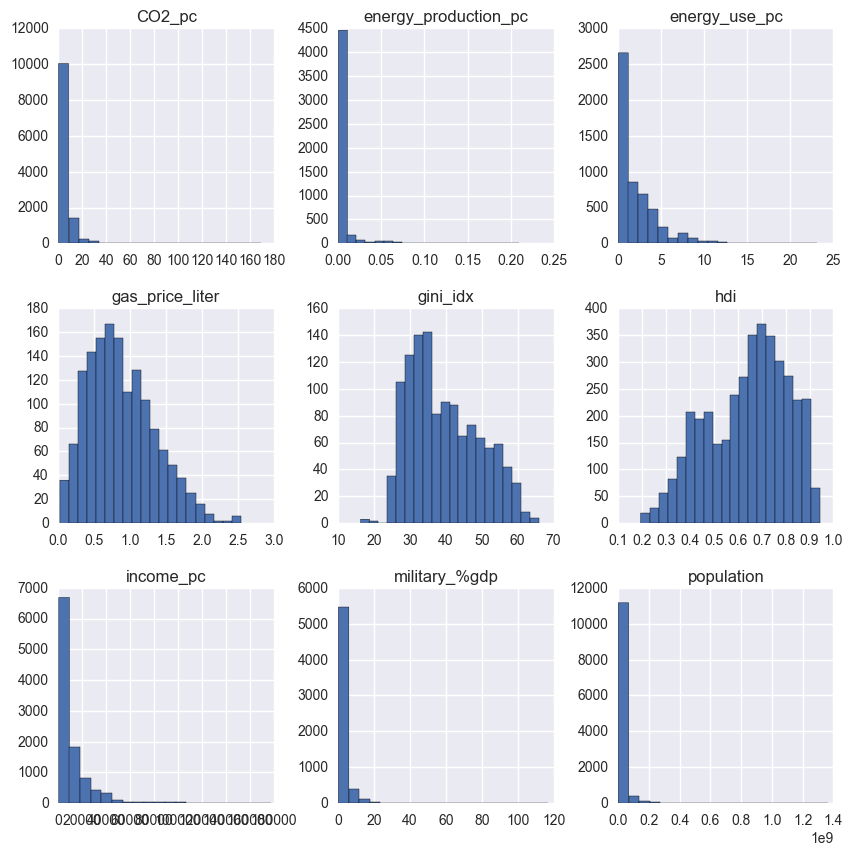

In [336]:
# look at histograms again
df.query(q).drop(['year'], axis=1)\
    .hist(figsize=(10,10), bins=20); 


### Lots of negative-skew columns

All the columns except `gini_idx`, `gas_price_liter` and `hdi` are strongly negatively skewed.

Let's apply a log transform to these skewed columns.

In [411]:
transform_cols = [u'CO2_pc', u'energy_use_pc', u'energy_production_pc', u'income_pc',
       u'military_%gdp', u'population', ]

log_df = df.copy()

log_df[transform_cols] = df[transform_cols].apply(np.log)

In [412]:
# rename
new_names = [(i,'log_'+i) for i in log_df[transform_cols].columns.values]
log_df.rename(columns = dict(new_names), inplace=True)
log_df.head()

,country,region,sub-region,year,log_CO2_pc,log_energy_use_pc,log_energy_production_pc,hdi,log_income_pc,gini_idx,log_military_%gdp,log_population,gas_price_liter
0,Afghanistan,Asia,Southern Asia,1949,-6.308919,NaN,NaN,NaN,6.937314,NaN,NaN,NaN,NaN
1,Afghanistan,Asia,Southern Asia,1950,-4.520829,NaN,NaN,NaN,6.946976,NaN,NaN,15.863477,NaN
2,Afghanistan,Asia,Southern Asia,1951,-4.449022,NaN,NaN,NaN,6.966024,NaN,NaN,15.874676,NaN
3,Afghanistan,Asia,Southern Asia,1952,-4.461070,NaN,NaN,NaN,6.975414,NaN,NaN,15.886768,NaN
4,Afghanistan,Asia,Southern Asia,1953,-4.325268,NaN,NaN,NaN,7.021084,NaN,NaN,15.899730,NaN


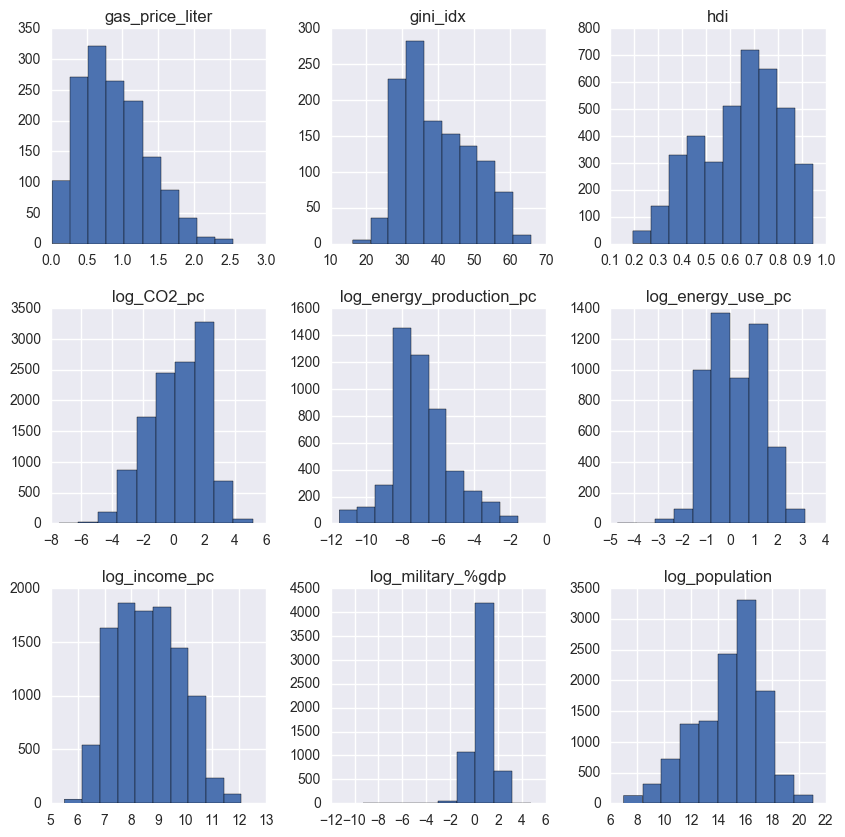

In [413]:
# let's revisit the histograms once more
log_df.query(q).drop(['year'], axis=1)\
    .hist(figsize=(10,10), bins=10); 


The columns look now more or less normal.

In [414]:
log_df.query(q).drop('year', axis=1).corr()

,log_CO2_pc,log_energy_use_pc,log_energy_production_pc,hdi,log_income_pc,gini_idx,log_military_%gdp,log_population,gas_price_liter
log_CO2_pc,1.000000,0.903068,0.546310,0.889769,0.889814,-0.385642,0.180863,-0.110599,0.009347
log_energy_use_pc,0.903068,1.000000,0.591442,0.840369,0.860502,-0.479480,0.025848,-0.170663,0.128505
log_energy_production_pc,0.546310,0.591442,1.000000,0.424285,0.553763,-0.181531,0.177499,-0.129609,-0.127419
hdi,0.889769,0.840369,0.424285,1.000000,0.925830,-0.436064,0.031799,-0.097885,0.234777
log_income_pc,0.889814,0.860502,0.553763,0.925830,1.000000,-0.350320,0.139136,-0.035158,0.142668
gini_idx,-0.385642,-0.479480,-0.181531,-0.436064,-0.350320,1.000000,-0.010215,0.103288,-0.410351
log_military_%gdp,0.180863,0.025848,0.177499,0.031799,0.139136,-0.010215,1.000000,0.077721,-0.237747
log_population,-0.110599,-0.170663,-0.129609,-0.097885,-0.035158,0.103288,0.077721,1.000000,-0.105324
gas_price_liter,0.009347,0.128505,-0.127419,0.234777,0.142668,-0.410351,-0.237747,-0.105324,1.000000


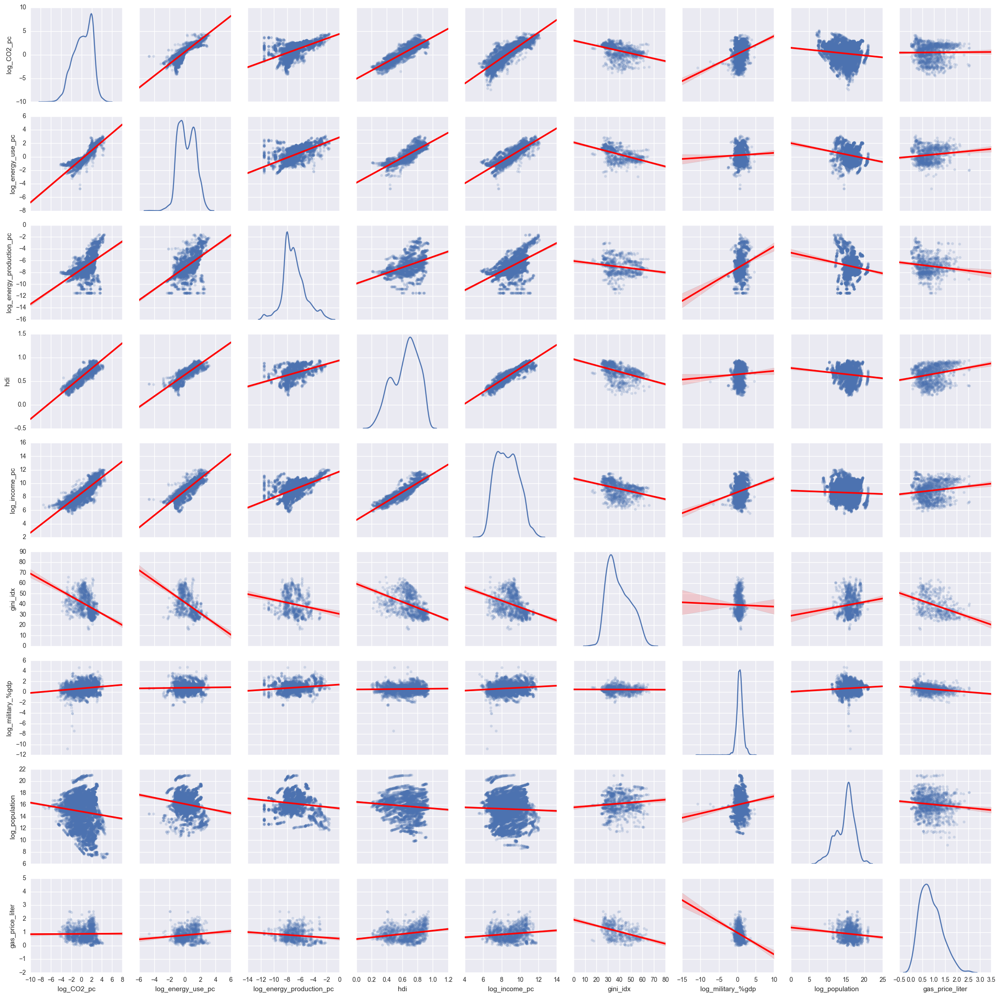

In [415]:
# pairplot
#sns.pairplot(df.query(q).dropna().drop(['year'], axis=1));
plot_kws={'line_kws':{'color':'red'}, 'scatter_kws': {'alpha': 0.2}}
sns.pairplot(log_df.query(q).drop(['year'], axis=1), 
             kind='reg', diag_kind='kde', plot_kws = plot_kws);

Aside from the energy, income, and HDI columns (which is also strongly correlated with energy use and income), there's no surprising correlations with `CO2_pc` here.

Maybe if we look by region....

## Regions distributions of transformed columns

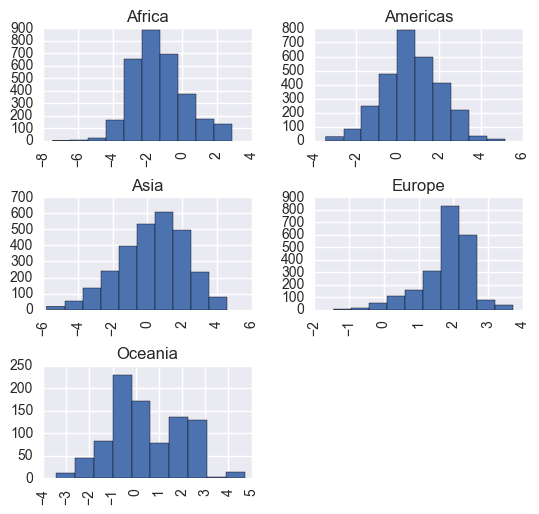

In [416]:
q = "year >= 1950"
val = 'log_CO2_pc'
log_df.query(q)[val].hist(by = df['region'], figsize=(6,6));

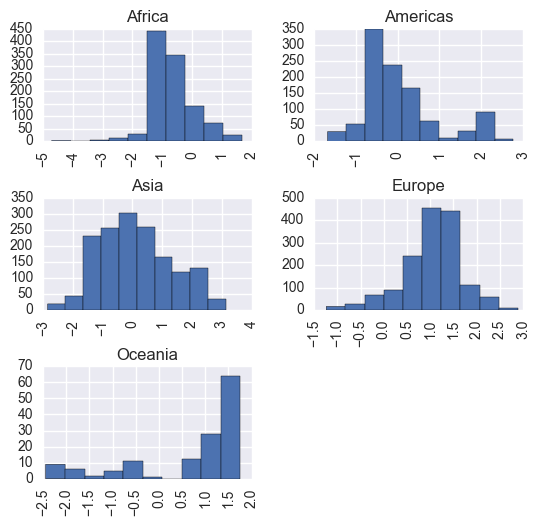

In [382]:
val = 'log_energy_use_pc'
df.query(q)[val].hist(by = df['region'], figsize=(6,6));

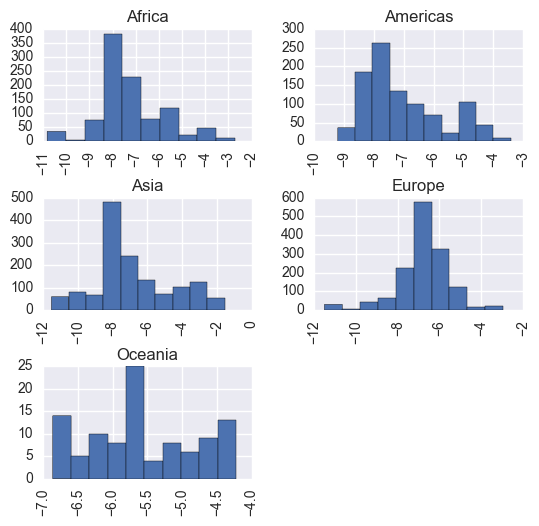

In [389]:
val = 'log_energy_production_pc'
log_df.query(q)[val].hist(by = df['region'], figsize=(6,6));l

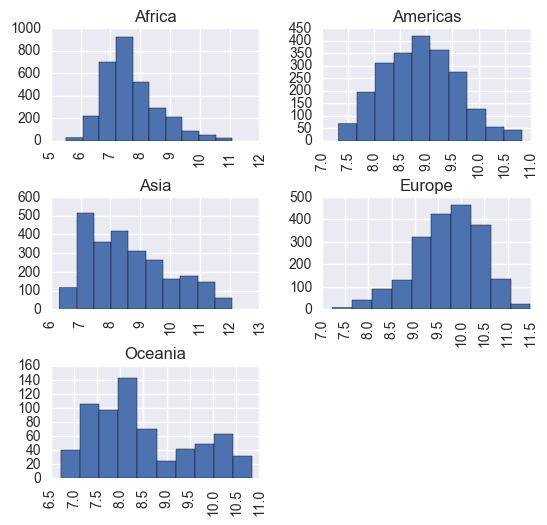

In [417]:
val = 'log_income_pc'
log_df.query(q)[val].hist(by = df['region'], figsize=(6,6));

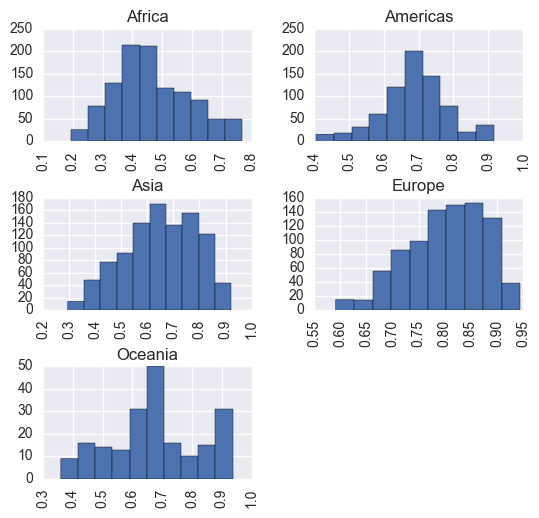

In [391]:
val = 'hdi'
df.query(q)[val].hist(by = df['region'], figsize=(6,6));

Oceania's distributions for these high-correlating columns are bi- (if not multi-) modal. The Americas and Asia also have a few non-normal histograms. 

Interestingly Africa and Europe, the regions at the top & the bottom of the CO2 emissions scale, have the most consistently normal histograms.

In [418]:
# correlations by region, hiding weak ones
val = 'log_CO2_pc'
corr_reg_df = log_df.query(q).drop(['year'], axis=1).groupby('region').corr()
mask_lower = abs(corr_reg_df) < .5 
corr_reg_df.mask(mask_lower)[val]

region                            
Africa    gas_price_liter                  NaN
          gini_idx                         NaN
          hdi                         0.857341
          log_CO2_pc                  1.000000
          log_energy_production_pc    0.601309
          log_energy_use_pc           0.723976
          log_income_pc               0.843556
          log_military_%gdp                NaN
          log_population                   NaN
Americas  gas_price_liter                  NaN
          gini_idx                   -0.575580
          hdi                         0.828118
          log_CO2_pc                  1.000000
          log_energy_production_pc    0.755659
          log_energy_use_pc           0.939027
          log_income_pc               0.877506
          log_military_%gdp                NaN
          log_population                   NaN
Asia      gas_price_liter                  NaN
          gini_idx                         NaN
          hdi            

Breaking down by region, the only differences are in: 
* Europe, which seems to be the outlier region in general. It doesn't seem to behave as the others, which is unsurprising given the continent's historical advantage in trade and industrialization.
* Oceania. However, I don't entirely trust Oceania's correlations because:
    * the population of countries for Oceania is less than half that of the other regions
    * its distribution of `CO2_pc`, even with a log transformation, is not normal.
    * its distribution of wealth, in terms of income and HDI, I suspect is highly unequal. It seems to be essentially concentrated in the sub-region 'Australia & New Zealand'. 

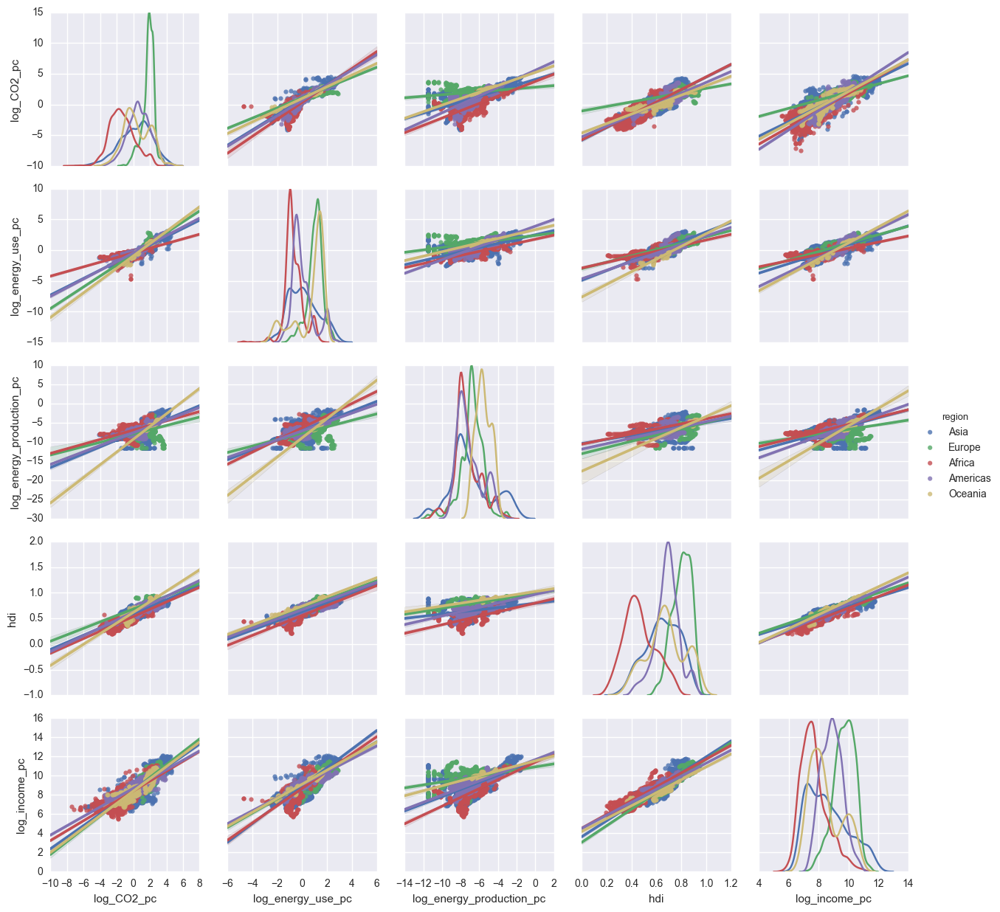

In [419]:
# pairplot by region
pp_plot_vars = ['region','log_CO2_pc', 'log_energy_use_pc', 'log_energy_production_pc', 'hdi', 'log_income_pc']
pp_df = log_df.query(q)[pp_plot_vars]
sns.pairplot(pp_df, hue='region', diag_kind='kde', kind='reg');

When you look at correlations by region, Oceania's look amazingly strong. However, looking Oceania's histograms and points in the pairplot matrix, the data, even when log transformed, is not normally distributed. 

On the pairplot Oceania's data points (already sparse compared to other regions) form clumps, with outliers that can exagerate the slope of the trendline.

In [420]:
log_df.query(q).drop(['year'], axis=1)\
    .groupby(['region'])\
    .agg(['mean', 'std']).round(2)

log_CO2_pc       log_energy_use_pc       log_energy_production_pc  \
               mean   std              mean   std                     mean   
region                                                                       
Africa        -1.33  1.50             -0.65  0.73                    -7.27   
Americas       0.69  1.35              0.05  0.89                    -7.05   
Asia           0.31  1.91              0.13  1.19                    -6.86   
Europe         1.81  0.73              1.05  0.62                    -6.81   
Oceania        0.45  1.55              0.69  1.24                    -5.55   

                 hdi       log_income_pc       gini_idx        \
           std  mean   std          mean   std     mean   std   
region                                                          
Africa    1.40  0.47  0.13          7.69  0.91    43.70  8.24   
Americas  1.31  0.69  0.10          8.88  0.71    50.18  6.34   
Asia      2.30  0.65  0.14          8.64  1.38    36.19  5.84   
Europe    1.27  0.80  0.07          9.71  0.72    31.34  4.14   
Oceania   0.78  0.68  0.15          8.49  1.08    38.02  5.43   

         log_military_%gdp       log_population       gas_price_liter        
                      mean   std           mean   std            mean   std  
region                                                                       
Africa                0.56  0.87          15.15  1.77            0.84  0.42  
Americas              0.51  0.77          13.72  2.79            0.76  0.37  
Asia                  1.18  0.87          15.93  2.09            0.70  0.44  
Europe                0.62  0.55          15.50  2.01            1.20  0.45  
Oceania               0.44  0.59          12.05  2.28            0.91  0.38

# Carbon footprints

Almost all the variables we've been looking at are per capita. It's time to step back and look once more at the overall picture. 

So who has the biggest carbon footprint these days? China? The US? Let's see.

In [435]:
# convert population to int
# to enable bubble plots later on

df['population'] = df['population'].astype(int)
df['CO2footprint'] =  df['CO2_pc'].multiply(df['population'])

## Evolution over time

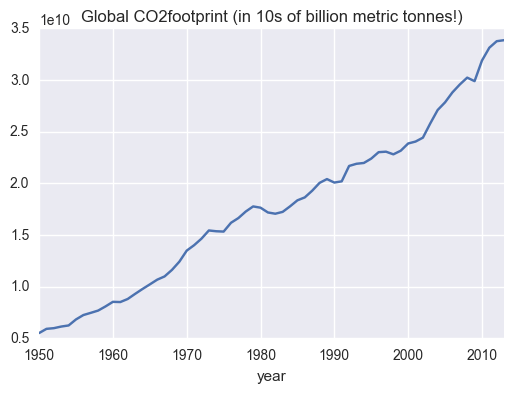

In [89]:
# What does the global trend line look like?
kind = 'Global'
val = 'CO2footprint'
unit = '(in 10s of billion metric tonnes!)'

annual_totals = df.groupby('year').sum()[val]
annual_totals.loc[1950:].plot()
plt.title(" ".join([kind, val, unit]));

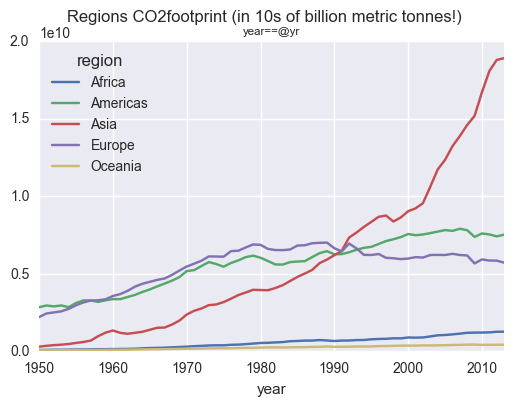

In [90]:
# regional timeseries
kind = 'Regions'
annual_totals = df.groupby(['region','year']).sum()[val]
annual_totals.unstack(level=0).loc[1950:].plot()
plt.suptitle(" ".join([kind, val, unit]))
plt.title(q, fontsize='x-small');

## Inflection point at 1990

1990 was an inflection point for both Asia and Europe's carbon footprints, where the former began to exceed the latter. Shortly afterwards, Asia's footprint began skyrocketing, while Europe's began a gradual downward trajectory.

## 1990 vs 2013 bubble plots

In [452]:
# what did this look like a few decades earlier?
yr = 1990
q = "year==@yr"
val = 'CO2_pc'
size = 'CO2footprint'
x = 'population'
df.query(q).iplot(kind='bubble', x=x, y=val, size=size, text='country',\
           xTitle= x + " (log scale)", yTitle=val, categories='region', logx=True,\
             title='Who had the biggest %s in %s?' % (size, yr))

In [434]:
# how big was the US footprint back then?
df[['country','CO2_pc', 'population', 'CO2footprint']].loc[df.query(q)['CO2footprint'].idxmax()]

country         United States
CO2_pc                19.0752
population          252847810
CO2footprint      4.82312e+09
Name: 16152, dtype: object

In [450]:
# show in bubble plot for most recent year
max_yr = df['year'].max()

yr = max_yr
q = "year==@max_yr"
val = 'CO2_pc'
size = 'CO2footprint'
x = 'population'
df.query(q).iplot(kind='bubble', x=x, y=val, size=size, text= 'country',\
           xTitle= x + " (log scale)", yTitle=val, categories='region', logx=True,\
             title='Who had the biggest %s in %s?' % (size, yr))

In [451]:
# Look at the numbers for the country with biggest footprint in @max_yr
df[['country','CO2_pc', 'population', 'CO2footprint']].loc[df.query(q)['CO2footprint'].idxmax()]

country               China
CO2_pc              7.52178
population       1362514260
CO2footprint    1.02485e+10
Name: 3156, dtype: object

## Biggest increases & decreases

In [454]:
# change from 1990 to 2013 by country
q = "year == 1990 | year == 2013"
val = 'CO2footprint'
footprint_df = df.query(q).set_index(['year', 'country']).drop(['region', 'sub-region'], axis=1)[val]
footprint_df = footprint_df.unstack()
footprint_df

country,Afghanistan,Albania,Algeria,Andorra,Angola,Anguilla,Antigua And Barbuda,Argentina,Armenia,Aruba,...,Uruguay,Uzbekistan,Vanuatu,Venezuela,Vietnam,Wallis Et Futuna,Yemen,Yugoslavia,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,
1990,2.614318e+06,5.309325e+06,7.793506e+07,NaN,5.115037e+06,NaN,300666.91798,1.126034e+08,NaN,1.730666e+06,...,3.993006e+06,NaN,65999.5133,1.221512e+08,2.140622e+07,NaN,9.595672e+06,1.337910e+08,2.445630e+06,1.550268e+07
2013,2.126665e+07,4.814330e+06,1.342036e+08,419453.4275,3.246099e+07,120066.375,524333.59650,1.898012e+08,5.496328e+06,8.763332e+05,...,7.604678e+06,1.032168e+08,106334.3633,1.855150e+08,1.526107e+08,22011.6125,2.534402e+07,NaN,3.824328e+06,1.377939e+07


In [442]:
# what is the total CO2 footprint for 2013?
# will be used later to calculate % of totals
q = "year == 2013"
ww_footprint = df.query(q)[val].sum()
ww_footprint.round(0)

33853525731.0

In [558]:
# Helper functions

def topN_change(df, row, chg, n=5):
    '''Calculates difference between specified row & 
    previous row, returning highest N results'''

    if chg == 'diff':
        return df.diff().round(2).loc[row]\
        .dropna().sort_values(ascending=False).head(n)
        
    elif chg == 'pct':
        return df.pct_change().multiply(100).round(2).loc[row]\
        .dropna().sort_values(ascending=False)\
        .head(n)
        
    else:
        "Unrecognized function type for 'chg'. Specify 'diff' or 'pct'."
        
def bottomN_change(df, row, chg, n=5):
    '''Calculates difference between specified row & 
    previous row, returning lowest N results'''
    
    if chg == 'diff':
        return df.diff().round(2).loc[row]\
        .dropna().sort_values().head(n)
    elif chg == 'pct':
        return df.pct_change().multiply(100).round(2).loc[row]\
        .dropna().sort_values()\
        .head(n)
    else:
        "Unrecognized function type for 'chg'. Specify 'diff' or 'pct'."

In [559]:
# which countries had the biggest % incr
topN_change(footprint_df, 2013, 'pct')

country
Namibia              7207.84
Equatorial Guinea    4372.68
Somalia              3300.37
Nepal                 924.76
Lao                   922.52
Name: 2013, dtype: float64

In [560]:
# biggest % decrease?
bottomN_change(footprint_df, 2013, 'pct')

country
North Korea   -77.65
Nauru         -65.76
Romania       -55.47
Aruba         -49.36
Bulgaria      -47.78
Name: 2013, dtype: float64

In [561]:
# The biggest absolute incr?
topN_change(footprint_df, 2013, 'diff')

country
China            7.788010e+09
India            1.415467e+09
Iran             4.059290e+08
United States    3.625781e+08
South Korea      3.455244e+08
Name: 2013, dtype: float64

In [562]:
# and the biggest absolute decr?
bottomN_change(footprint_df, 2013, 'diff')

country
Russia           -5.401862e+08
Germany          -2.563956e+08
North Korea      -1.740604e+08
United Kingdom   -9.844260e+07
Romania          -8.811719e+07
Name: 2013, dtype: float64

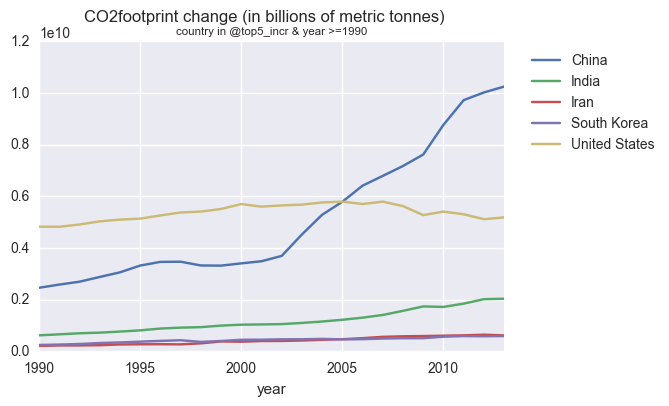

In [569]:
# plot increase
top5_incr = topN_change(footprint_df, 2013, 'diff').index.values
q = "country in @top5_incr & year >=1990"
unit = "(in billions of metric tonnes)"
main_title = " ".join([val, "change", unit])

df.query(q).set_index(['year', 'country'])[val]\
    .unstack()\
    .plot()
    
plt.suptitle(main_title)
plt.title(q, fontsize='x-small')
plt.legend(loc='best', bbox_to_anchor=(1.35, 1));

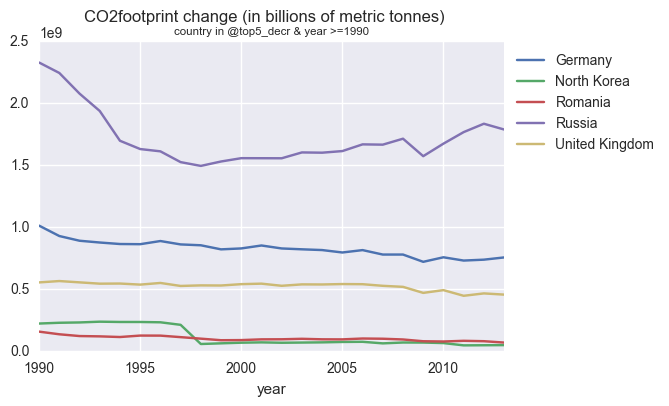

In [566]:
# plot decrease
top5_decr = bottomN_change(footprint_df, 2013, 'diff').index.values
q = "country in @top5_decr & year >=1990"
unit = "(in billions of metric tonnes)"
main_title = " ".join([val, "change", unit])

df.query(q).set_index(['year', 'country'])[val]\
    .unstack()\
    .plot()
    
plt.suptitle(main_title)
plt.title(q, fontsize='x-small')
plt.legend(loc='best', bbox_to_anchor=(1.35, 1));

### How many are increasing vs decreasing their footprint?

In [109]:
# How many countries saw in incr in CO2 emissions between 1990 & 2013?
footprint_chg = footprint_df.unstack().pct_change().multiply(100).loc[2013]
footprint_chg.where(footprint_chg > 0).count()

155

In [570]:
# what was their total footprint increase?
total_incr = footprint_chg.where(footprint_chg > 0).sum().round(0)
total_incr

41205.0

In [571]:
# how many saw a decrease?
footprint_chg.where(footprint_chg <= 0).count()

29

In [572]:
# what was their total footprint decrease?
total_decr = footprint_chg.where(footprint_chg <= 0).sum().round()
total_decr

-729.0

In [577]:
# .... with a net result of 
net_chg = np.add(total_incr, total_decr)
net_chg

40476.0

In [580]:
# the decrease offset the 
# global CO footprint increase by..
round((total_decr/total_incr * 100), 2)

-1.77

This is depressing.

But are there distinctive patterns of top-growing footprint countries vs the top-shrinking ones?

### Compare correlations

In [607]:
# compare correlations for the two groups
countries_incr = footprint_chg.where(footprint_chg > 0).dropna().index.values
countries_decr = footprint_chg.where(footprint_chg <= 0).dropna().index.values

For correlations, let's look at top10 countries rather than top5.

In [582]:
# and the totals for top *absolute* incr & decr?
top10_incr = topN_change(footprint_df, 2013, 'diff', 10).index.values
top10_decr = bottomN_change(footprint_df, 2013, 'diff', 10).index.values
#top10_incr = footprint_chg.where(footprint_chg > 0).dropna().sort_values().tail(10).index.values
#top10_decr = footprint_chg.where(footprint_chg <= 0).dropna().sort_values().head(10).index.values

In [608]:
# correlations for all incr countries
q = "year >= 1990 & country in @countries_incr"
val = 'CO2_pc'
df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                  1.000000
energy_use_pc           0.965497
income_pc               0.867612
energy_production_pc    0.789113
hdi                     0.564743
CO2footprint            0.153196
military_%gdp           0.137066
year                    0.048113
population             -0.026946
gas_price_liter        -0.152240
gini_idx               -0.429557
Name: CO2_pc, dtype: float64

In [610]:
# look at log df too
val = 'log_CO2_pc'
log_df.query(q).corr()[val].sort_values(ascending=False)

log_CO2_pc                  1.000000
log_income_pc               0.941429
log_energy_use_pc           0.919221
hdi                         0.897939
log_energy_production_pc    0.549409
log_military_%gdp           0.163253
year                        0.089408
gas_price_liter            -0.087815
log_population             -0.212862
gini_idx                   -0.231100
Name: log_CO2_pc, dtype: float64

In [613]:
# correlations for all decr countries
q = "year >= 1990 & country in @countries_decr"
val = 'CO2_pc'
df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                  1.000000
hdi                     0.667329
energy_use_pc           0.510012
income_pc               0.495162
energy_production_pc    0.422536
CO2footprint            0.208449
gas_price_liter         0.192986
gini_idx                0.098299
population              0.021292
military_%gdp          -0.148697
year                   -0.150723
Name: CO2_pc, dtype: float64

In [612]:
val = 'log_CO2_pc'
log_df.query(q).corr()[val].sort_values(ascending=False)

log_CO2_pc                  1.000000
hdi                         0.826417
log_energy_use_pc           0.800907
log_income_pc               0.769187
log_energy_production_pc    0.599402
gas_price_liter             0.200571
log_military_%gdp           0.150077
year                       -0.091088
gini_idx                   -0.108912
log_population             -0.243123
Name: log_CO2_pc, dtype: float64

In [601]:
# Correlations for top 10 increasing footprint countries
q = "year >= 1990 & country in @top10_incr"
val = 'CO2_pc'

df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                  1.000000
energy_use_pc           0.984426
income_pc               0.949459
hdi                     0.822327
energy_production_pc    0.613487
military_%gdp           0.610807
CO2footprint            0.399710
year                    0.140292
gas_price_liter        -0.127338
population             -0.304508
gini_idx               -0.533951
Name: CO2_pc, dtype: float64

In [586]:
# what about log values?
val = 'log_CO2_pc'

log_df.query(q).corr()[val].sort_values(ascending=False)

log_CO2_pc                  1.000000
log_energy_use_pc           0.979622
log_income_pc               0.885143
hdi                         0.874284
log_energy_production_pc    0.747677
log_military_%gdp           0.604471
year                        0.208865
gas_price_liter            -0.083536
log_population             -0.480921
gini_idx                   -0.683479
Name: log_CO2_pc, dtype: float64

While there are strong correlations in both data sets, there seems to be more strong correlations with the log transformed data.


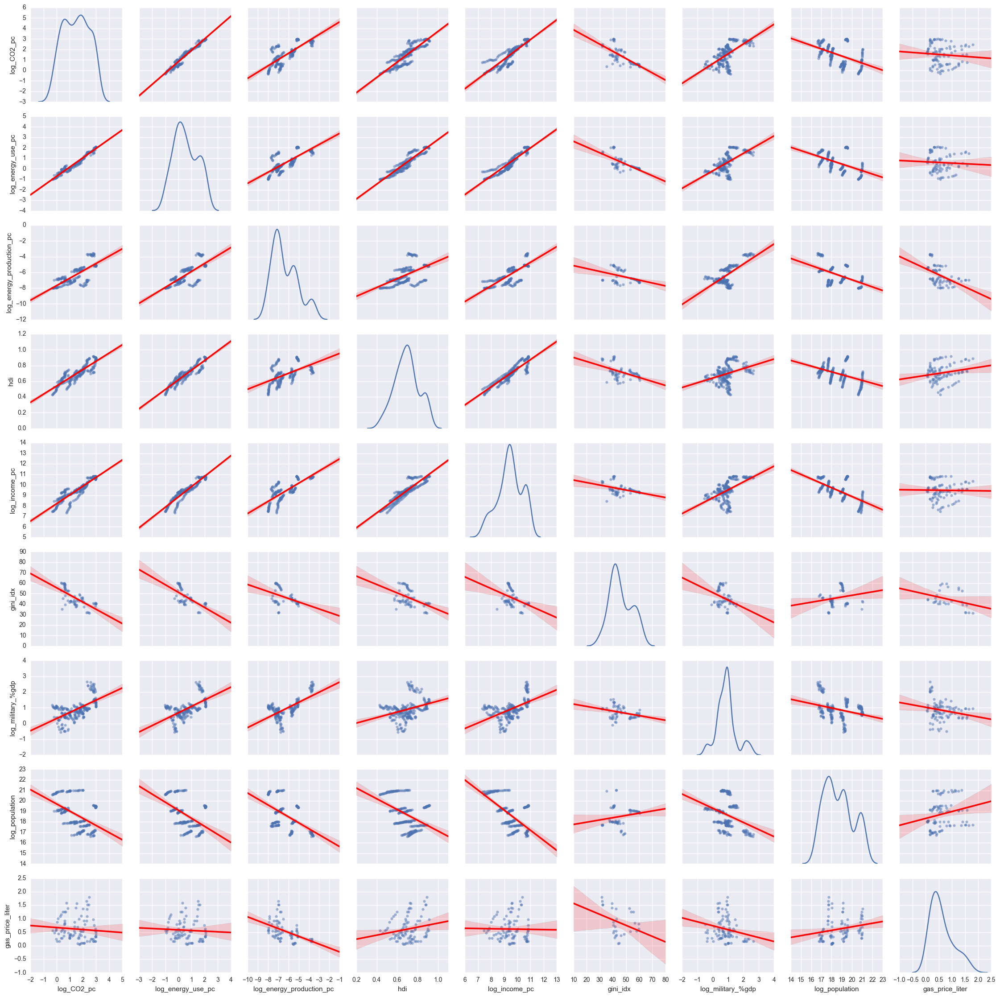

In [602]:
plot_kws={'line_kws':{'color':'red'}, 'scatter_kws': {'alpha': 0.5}}
sns.pairplot(log_df.query(q).drop(['year'], axis=1),\
             kind='reg', diag_kind='kde', plot_kws = plot_kws);

In [604]:
# any different for the shrinking footprint group?
q = "year >= 1990 & country in @top10_decr"
val = 'CO2_pc'

df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                  1.000000
energy_use_pc           0.692733
energy_production_pc    0.596612
CO2footprint            0.580097
population              0.431504
gini_idx                0.311231
income_pc               0.249289
military_%gdp           0.113080
hdi                     0.076145
gas_price_liter        -0.005561
year                   -0.292890
Name: CO2_pc, dtype: float64

The correlations are noticeably lower than those for the top increasing-footprint countries.

Let's look at the log correlations.

In [594]:
# what about log values?
val = 'log_CO2_pc'

log_df.query(q).corr()[val].sort_values(ascending=False)

log_CO2_pc                  1.000000
log_energy_use_pc           0.718047
log_energy_production_pc    0.546683
log_income_pc               0.484044
gini_idx                    0.323269
log_population              0.276292
hdi                         0.134552
gas_price_liter             0.078427
log_military_%gdp           0.038576
year                       -0.289188
Name: log_CO2_pc, dtype: float64

The strongest correlations for the log df are still weaker than those of the original columns.

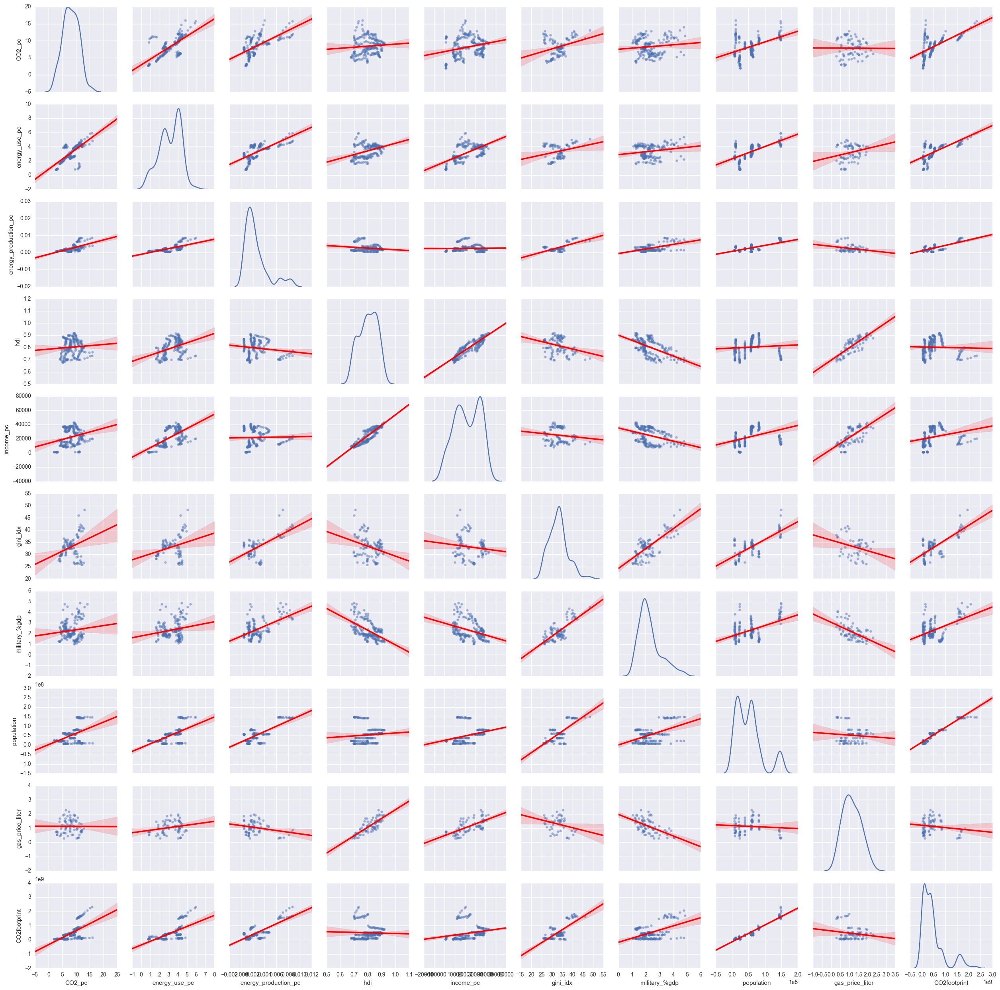

In [606]:
# stick with original df when looking at decreasing-footprint countries
q = "year >= 1990 & country in @top10_decr"
sns.pairplot(df.query(q).drop(['year'], axis=1), 
             kind='reg', diag_kind='kde', plot_kws = plot_kws);

In [ ]:
# regional differences?
df.query(q).groupby('region').corr()[val].sort_values(ascending=False).unstack(level=0)

In [ ]:
df.query(q).groupby('region')['country'].unique().apply(lambda x: len(x))

In [ ]:
s = df.query(q).groupby('region')['country'].unique()
s.apply(", ".join)

In [ ]:
# regional differences?
df.query(q).groupby('region').corr()[val].sort_values(ascending=False).unstack(level=0)

In [ ]:
# how many countries in each of these regions?
df.query(q).groupby('region')['country'].unique().apply(lambda x: len(x))

In [ ]:
q = "year >= 1990 & country in @top10_incr"
val = 'CO2footprint'

df.query(q).corr()[val].sort_values(ascending=False)

In [ ]:
q = "year >= 1990 & country in @countries_incr"
val = 'CO2footprint'

df.query(q).corr()

In [ ]:
q = "year == 2013"
df.query(q).set_index('country')['CO2footprint'].sort_values(ascending=False).head(20)

In [ ]:
top5_ttl_incr + top5_ttl_decr

In [ ]:
# Looking at the graph, it's still hard to 
# grasp how the US still has such big
# footprint incr, as the curve appears flat. 
# But when viewed on its own, the incr is clear

q = "country == 'United States' & year >=1990"

df.query(q).set_index(['year', 'country'])[val]\
    .unstack()\
    .plot(legend=False)
    
plt.suptitle(val)
plt.title(q, fontsize='x-small');

In [ ]:
# what % is the 2013 footprint for top5_incr
# compared to world total?

q = "year == 2013 & country in @top5_incr"

footprints = df.query(q)[['country', val]]

pct_total = footprints[['country', val]][val]\
    .divide(ww_footprint).multiply(100)\
    .rename('% of Total')
    
pd.concat([footprints, pct_total], axis=1).sort_values('% of Total')

In [ ]:
# can we visualize this?

q = "year == 2013"
bigfoot_bool = df.query(q)['country']\
    .apply(lambda x: x if x in top5_incr else 'Rest of world')\
    .rename('label')
    
footprint_by_label = pd.concat([df.query(q)[['country', 'CO2footprint']], bigfoot_bool], axis=1)\
    .groupby('label').sum()
    
footprint_by_label[val].sort_values().plot(kind='pie', colormap='YlOrRd')
plt.suptitle("Footprint of countries in Top 5 biggest incr is > 50% WW footprint")
plt.title(q, fontsize='x-small');


In [ ]:
q = "year >= 1950"
kind = 'Regions'
val = 'CO2footprint'

annual_totals = df.query(q).groupby(['region','year']).sum()[val]
annual_totals.unstack(level=0).loc[1950:].plot()

plt.suptitle(" ".join([kind, val, unit]))
plt.title(q, fontsize='x-small');

In [ ]:
# 2013 total CO2 footprint for Europe
q = "year==@end_yr & region=='Europe'"
total_2013 = df.query(q)['CO2footprint'].sum()
total_2013

q = "year==1990 & region=='Europe'"
total_1990 = df.query(q)['CO2footprint'].sum()
total_1990

(total_2013-total_1990)/total_1990

In [ ]:
# how does this compare to other regions?
q = "year==@end_yr"
total_2013 = df.query(q).groupby('region')['CO2footprint'].sum()
total_2013

q = "year==1990"
total_1990 = df.query(q).groupby('region')['CO2footprint'].sum()
total_1990

(total_2013-total_1990)/total_1990

## Correlations

In [93]:
# global correlations

q="year >=1950"
val = 'CO2_pc'
df.query(q).corr()[val].sort_values(ascending=False)

CO2_pc                  1.000000
energy_use_pc           0.838864
income_pc               0.770431
energy_production_pc    0.649464
hdi                     0.562471
CO2footprint            0.150203
year                    0.082743
military_%gdp           0.055104
gini_idx                0.045282
population             -0.017419
gas_price_liter        -0.038560
Name: CO2_pc, dtype: float64

In [94]:
val = 'CO2_pc'
test = df.query(q)[val]
log_CO2 = test.apply(np.log).replace(['np.inf', -np.inf], np.nan).rename('log_co2')

In [95]:
pd.concat([df.query(q), log_CO2], axis=1).head()

,country,region,sub-region,year,CO2_pc,energy_use_pc,energy_production_pc,hdi,income_pc,gini_idx,military_%gdp,population,gas_price_liter,CO2footprint,log_co2
1,Afghanistan,Asia,Southern Asia,1950,0.01088,NaN,NaN,NaN,1040.0,NaN,NaN,7752118,NaN,84343.04384,-4.520829
2,Afghanistan,Asia,Southern Asia,1951,0.01169,NaN,NaN,NaN,1060.0,NaN,NaN,7839426,NaN,91642.88994,-4.449022
3,Afghanistan,Asia,Southern Asia,1952,0.01155,NaN,NaN,NaN,1070.0,NaN,NaN,7934798,NaN,91646.91690,-4.461070
4,Afghanistan,Asia,Southern Asia,1953,0.01323,NaN,NaN,NaN,1120.0,NaN,NaN,8038312,NaN,106346.86776,-4.325268
5,Afghanistan,Asia,Southern Asia,1954,0.01305,NaN,NaN,NaN,1130.0,NaN,NaN,8150037,NaN,106357.98285,-4.338967


In [100]:
val='log_co2'
corr = pd.concat([df.query(q), log_CO2], axis=1).groupby('region').corr()
corr[val].unstack().style.apply(highlight_max)

,CO2_pc,CO2footprint,energy_production_pc,energy_use_pc,gas_price_liter,gini_idx,hdi,income_pc,log_co2,military_%gdp,population,year
region,,,,,,,,,,,,
Africa,0.735228,0.418488,0.490926,0.73983,-0.119407,0.00872516,0.857341,0.657692,1,0.115156,0.0675816,0.265516
Americas,0.622515,0.269703,0.658971,0.792839,-0.0430382,-0.0200649,0.828118,0.77786,1,0.0963157,0.209669,0.391036
Asia,0.641821,0.121543,0.506863,0.706342,-0.053903,0.108371,0.846306,0.644585,1,0.226244,-0.0323186,0.356345
Europe,0.847264,0.29978,0.140987,0.674248,0.046361,-0.0853361,0.481794,0.507965,1,-0.0668541,0.203314,0.251754
Oceania,0.664392,0.382231,0.878265,0.947215,0.230912,0.190263,0.895145,0.815522,1,0.731933,0.35829,0.240294


In [101]:
# correlations for top5 biggest CO2 footprint increases

q = "year >= 1950 & country in @top5_incr"
val = 'CO2_pc'
df.query(q).corr()[val].sort_values(ascending=False)

UndefinedVariableError: local variable 'top5_incr' is not defined

In [ ]:
# correlations for top5 biggest CO2 footprint *decreases*

q = "year >= 1950 & country in @top5_decr"
val = 'CO2_pc'
df.query(q).corr()[val].sort_values(ascending=False)

In [ ]:
# analyze with heatmap
q = "year >= 1990 & country in @top5_decr"

# need shorter column names for legibility
def shorten_colnames(df, index_cols):
    cols=df.set_index(index_cols).columns
    colnames = pd.Series(cols).apply(str.split, args=('_')).apply(lambda x: x[0])
    colnames_dict = pd.Series(index=cols, data=colnames.values)\
        .to_dict()
    return colnames_dict

In [ ]:
# create heatmap df
colname_dict = shorten_colnames(df.query(q), ['year'])
hm_df = df.query(q).set_index('year').drop(['region', 'sub-region', 'country'], axis=1)\
    .rename(columns=colname_dict)
hm_df.head()

In [ ]:
# normalize & plot
normalized_df=(hm_df-hm_df.min())/(hm_df.max()-hm_df.min())
normalized_df.iplot(kind='heatmap', colorscale='YlOrRd', title=str.upper(q))

In [ ]:
# what are the correlations for each region?
corr_df = df.query(q).groupby('region').corr().unstack()[val]
#corr_df.style.apply(highlight_max)
corr_df

In [ ]:
mask_lower = abs(corr_df) < .6 # hide weak correlations
corr_df.mask(mask_lower)

In [ ]:
# how much do these correlations vary by region?
corr_df.std().sort_values()

In [ ]:
# get cols where at least 1 region 
# has corr > .6 or < -.6
high_corr_var = corr_df.mask(mask_lower).dropna(how='all', axis=1).columns.values.tolist()
high_corr_var

In [ ]:
def correlate_this(df, val):
    '''returns a correlation
    matrix for va'''
    corr_df = df.corr().unstack()[val].drop(val, axis=1)
    mask_lower = abs(corr_df) < .6 # hide weak correlations
    print "ALL CORRELATIONS:"
    print corr_df
    print "\n"
    print "GREATER THAN 0.6:"
    print corr_df.mask(mask_lower).dropna(how='all', axis=1)
   
    return corr_df
        
grp_df = df.groupby(['region'])
corr_df = correlate_this(grp_df, val)


In [ ]:
# plot scatter matrix
from pandas.plotting import scatter_matrix

# variables
q = "region=='Europe' & year >= 1950"
idx =  ['year', 'CO2footprint']

# shorten column names for legibility in scatter matrix
colnames_dict = shorten_colnames(df.query(q), idx)
sm_df = df.query(q).set_index(idx).rename(columns = colnames_dict)

# plot
scatter_matrix(sm_df, figsize=(10,10), alpha=0.2, grid=True)
plt.suptitle(q);

In [ ]:
# compare with other regions

#subset = df['region']=='Asia'
q = "year >= 1950 & region=='Oceania'"
#sm_df = df.query(q).loc[subset].set_index(['year', 'CO2footprint']).rename(columns = colnames_dict['columns'])

sm_df = df.query(q).set_index(['year', 'CO2footprint']).rename(columns = colnames_dict['columns'])

scatter_matrix(sm_df, figsize=(10,10), alpha=0.2, grid=True);

In [ ]:
# correlations by region
df.query(q).groupby('region').corr()[val].unstack().T\
.drop(['year','CO2footprint', val]).style.apply(highlight_max)

In [ ]:
corr_df = df.groupby('region').corr()[val].unstack().T\
.drop(['year','CO2footprint', val])

#corr_df.style.apply(color_negative_red, axis=1)
mask = corr_df.style.applymap(color_negative_red)
mask

### Observations

#### Energy, then Income have highest correlation with CO2 p.c. emissions

Motor vehicle ownership & HDI also show strong correlations. 
Kids surviving to 35 have a moderate negative correlation overall, and a strong negative correlation for Oceania.

Another exception for Oceania is sulfur emissions: it has the highest correlation with CO2 emissions for Oceania, whereas it is small everwhere else.

But to what extent are HDI scores, vehicle ownership, and surviving kids (i.e. family size) just proxies for income? 

## Is there a lot of variation in correlations within regions?

In [ ]:
# further break down CO2 correlation matrix by sub_region
co2_corr = df.query(q).groupby(['region', 'sub-region']).corr()[val]
co2_corr = co2_corr.unstack(level=(0,1))

co2_corr

### Observations
In North America, Family Size (Surviving Kids) has a positive correlation
There are fascinating descrepancies within the regions as well.

For example, North America is the only sub_region in the world where the more adult children in a family, the higher the per capita CO2 emissions.

Another unique exception in N. America: Energy has an exceptionally low correlation. But the correlation with motor vehicle ownership & % roads paved is the highest in the Americas.

## Are the regional breakdowns too arbitrary?

In some regions, there are 'gorillas' that could skew the numbers, such as the US in the Americas, or Australia for Oceania.

Looking at the bubble plots, in each region there seems to be an invisible line dividing a few high-income/energy/CO2 emitting countries from the mass of countries clustered in the bottom left.

In other words, do the 'have' countries emit CO2 for different reasons than the have-not countries, regardless of where they are located?

In [ ]:
# select columns to use in plots
plot_cols = [col for col in df.columns[5:-1]]
plot_cols

In [ ]:
df.info()

In [ ]:
# plot d col against CO2_pc
# bubbles color-coded by HDI level
q = "year >= 1950"
yr = last_valid
y = 'CO2_log'
x = 'hdi'
size= 'population'
#cat_col = 'income_pc'
#plot_df = pd.concat([df.query(q), log_co2], axis=1)
#plot_bubble(plot_df, x, 'region')
log_co2 = df.query(q)['CO2_pc'].apply(np.log).replace([np.inf, -np.inf], np.nan)\
    .rename('log_co2')
    
idx = ['region','country', 'year']
pp_df = pd.concat([df.query(q), log_co2], axis=1).set_index(idx)[[val, 'hdi']]\
    .reset_index(['region','country'])\
    .sort_values('region')
    


In [ ]:
g = sns.FacetGrid(pp_df, row="region",  hue="region")
g = (g.map(plt.scatter, "hdi", val, edgecolor="w")\
     .add_legend())


In [ ]:
# plot d col against CO2_pc
# bubbles color-coded by HDI level
for col in plot_cols:
    last_valid = df['year'].loc[df[col].last_valid_index()] # last non-null year for col
    q = "year == @last_valid"
    yr = last_valid
    y = 'CO2_pc'
    x = col
    size= 'population'
    cat_col = 'income_pc'
    make_cuts = True
    plot_bubble_with_cuts(df.query(q), col, cat_col)
    #plot_bubble(df.query(q), col, 'region')
    

In [ ]:
# compare on income levels
(q) = 'year==@end_yr'
x = 'income_pc'
y = 'CO2_pc'
size = 'CO2footprint'
cat_col = 'hdi'

plot_bubble_with_cuts(df.query((q)), cat_col)

In [ ]:
# look at the distributions by HDI level

# reshape so region, sub_region & CO2 are columns
#df_box = df.sort_values('hdi_level').set_index(['hdi_level', 'country'])['CO2']
#df_box.reset_index('country').boxplot(by='hdi_level', showfliers=False);

In [ ]:
# Create x, where x the 'scores' column's values as floats
x = df[[val]].values.astype(float)

# Create a minimum and maximum processor object
min_max_scaler = preprocessing.MinMaxScaler()

# Create an object to transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

df_normalized = pd.DataFrame(x_scaled)

In [ ]:
q = "year == 2013" # Kyoto Accord for Reduction of Greenhouse gases signed in Dec 1997
valcols = df.columns[4:-1]

for region in df['region'].unique():   
    hm_df = df.query(q).loc[df['region']==region].set_index('country')[valcols]
    normalized_df=(hm_df-hm_df.min())/(hm_df.max()-hm_df.min())
    normalized_df.sort_values(val).iplot(kind='heatmap', colorscale='YlOrRd', title=str.upper(region))

# Conclusions

## CO2 analysis

* Not surprisingly, per capita CO2 emissions are usually highly correlated with per capita income & energy consumption, and to a lesser extent, motor vehicle ownership & HDI score.

* There were intriguing outliers in Europe, all tiny countries: Luxembourg, Faroe Islands, Gibraltar & Estonia. Several Carribean countries had very high CO2 p.c. emissions. Some avenues worth exploring:
    * Is this because their tiny size forces them to import most goods? 
    * Many of these countries are quite wealthy. More flights taken? Higher yacht ownership? 


## Multi-variate analysis
* For multi-variate analysis, regional (continents) comparisions almost useless: too much noise within regions due to extreme outliers and unequal distribution of (wealthy) countries within sub-regions. Prime examples:
    * Americas: Northern Americas,  
    * Oceania:  Australia & New Zealand
    * Asia: Western Asia, which includes most of the OPEC countries
* Instead, segmenting by HDI level revealed interesting patterns in scatterplots of CO2 vs Surviving Kids - negatively correlated except for High or Very High HDI groups.


